## Attempting data analysis for P1
TODO:
1. merge relevant datasets
2. extract all gestures with mappings to text descriptions
3. preliminary attemps to classify gesture
4. generate visualizations

In [375]:
import pandas as pd
import numpy as np
import glob
import os
import cv2
from PIL import Image as im

### 1. merge relevant datasets

In [376]:
cwd = os.getcwd()
all_flat = sorted(glob.glob(os.path.join(cwd, "data/P1*FLAT*csv")))
all_pillow = sorted(glob.glob(os.path.join(cwd, "data/P1*PILLOW*.csv")))

In [377]:
ascii_to_gesture = {
    109: "massage",
    114: "rub",
    100: "drag",
    115: "slide",
    112: "poke",
    97: "pat",
    101: "press",
    116: "tap",
    110: "pinch",
    107: "knead",
    119: "twist",
    111: "no",
    99: "constant",
    102: "fist",
    108: "type",
    104: "karate",
    117: "drums",
    103: "outward_caress",
    122: "scratch",
    49: "flat_topleft",
    50: "flat_topright",
    51: "flat_bottomright",
    52: "flat_bottomleft",
    53: "flat_center",
    54: "curve_topleft",
    55: "curve_topright",
    56: "curve_bottomright",
    57: "curve_bottomleft",
    58: "curve_center"
}

In [429]:
class Gesture:
    def __init__(self, timestamps, pressure, shear_x, shear_y, label):
        self.timestamps = timestamps
        self.pressure = pressure
        self.shear_x = shear_x
        self.shear_y = shear_y
        self.label = label
        self.combined_data = [np.dstack((self.pressure[i,:,:], self.shear_x[i,:,:], self.shear_y[i, :, :])) for i in range(self.shear_y.shape[0])]
#         self.minmaxvals = [{'max': np.max(arr), 'min': np.min(arr)} for arr in [pressure, shear_x, shear_y]]
        self.minmaxvals = [{'min': -388.04999999999995, 'max': 92.8599999999999},
                             {'min': -133.57731796432398, 'max': 81.0916882485514},
                             {'min': -79.24876215870242, 'max': 121.02353454479137}]
    
    def normalize(self, arr):
        ret = arr.astype('float')
        for i in range(3):
            minval = self.minmaxvals[i]['min']
            maxval = self.minmaxvals[i]['max']
            if minval != maxval:
                ret[..., i] -= minval
                ret[..., i] *= (255.0 / (maxval - minval))
        return ret
    
    def to_video(self):
        width = 600
        height = 600
        channel = 3

        fps = self.timestamps.size/12.0

        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        video = cv2.VideoWriter(self.label+'2.mp4', fourcc, float(fps), (width, height))

        for d in self.combined_data:
            img = self.normalize(d).astype(np.uint8)
            img = img.repeat(100, 0).repeat(100, 1)
            print(img.shape)
            print(img)
            video.write(img)
        video.release()

    def to_img(self):
        avg_data = sum(self.combined_data)
        avg_data_100 = avg_data.repeat(100, 0).repeat(100, 1)
        img = im.fromarray(normalize(avg_data_100).astype('uint8'),'RGB')
        img.save(self.label+"2.jpg")
    

In [430]:
pressure_idx = list(filter(lambda n:n%5==3, range(1, 181)))
shear_up_idx = list(filter(lambda n:n%5==1, range(1, 181)))
shear_down_idx = list(filter(lambda n:n%5==0, range(1, 181)))
shear_left_idx = list(filter(lambda n:n%5==2, range(1, 181)))
shear_right_idx = list(filter(lambda n:n%5==4, range(1, 181)))

def transform_raw_data(df):
    def find_shear_x(l, r, l_avg, r_avg):
        return (l*r_avg - r*l_avg)/(l_avg + r_avg)

    def find_shear_y(u, d, u_avg, d_avg):
        return (u*d_avg - d*u_avg)/(u_avg + d_avg)
    
    def decompose_data(name, df, avg):
        # re-align time stamps to start at 0
        time_stamps = df.pop(df.columns[0]).to_numpy()
        time_stamps = time_stamps - time_stamps[0]

        # convert labels to respective gestures
        label = ascii_to_gesture.get(name)
        
        # extract specific channel data from each taxel

        raw_pressure = df[pressure_idx].to_numpy()
        pressure = raw_pressure - np.tile(avg[pressure_idx], (raw_pressure.shape[0], 1))
        shear_up = df[shear_up_idx].to_numpy()
        shear_down = df[shear_down_idx].to_numpy()
        shear_left = df[shear_left_idx].to_numpy()
        shear_right = df[shear_right_idx].to_numpy()

        # calculate shear
        shear_y = np.zeros(shear_up.shape)
        shear_x = np.zeros(shear_up.shape)

        for i in range(0, shear_up.shape[0]):
            for j in range(0, 36):
                shear_y[i][j] = find_shear_y(shear_up[i][j], shear_down[i][j], avg[5*j], avg[5*j+4])
                shear_x[i][j] = find_shear_x(shear_left[i][j], shear_right[i][j], avg[5*j+1], avg[5*j+3])
        
        # reshape and clean
        shear_y_3d = shear_y.reshape(shear_y.shape[0], 6, 6)
        shear_x_3d = shear_x.reshape(shear_y.shape[0], 6, 6)
        pressure_3d = pressure.reshape(shear_y.shape[0], 6, 6)

        shear_y_3d[np.where(np.isnan(shear_y_3d))] = 0
        shear_x_3d[np.where(np.isnan(shear_x_3d))] = 0
        pressure_3d[np.where(np.isnan(pressure_3d))] = 0
        
        return Gesture(time_stamps, pressure_3d, shear_x_3d, shear_y_3d, label)

    # average of the first 100 rows
    avg = df.iloc[0, 1:181].to_numpy()
    
    # remove unlablled data
    df = df[df[182] != 0]
    grouped_df = df.groupby(df.columns[-1])
    gestures = []
    for name, group in grouped_df:
        gestures.append(decompose_data(name, group, avg))
        print(group.shape)
    return gestures
    

In [431]:
gestures = []
for f in sorted(all_flat):
    df = pd.read_csv(f, header=None, skiprows=[0])
    gestures.extend(transform_raw_data(df))

(494, 182)
(506, 182)
(493, 182)
(497, 182)
(506, 182)
(493, 182)
(499, 182)
(495, 182)
(483, 182)
(486, 182)
(476, 182)
(473, 182)
(496, 182)
(483, 182)
(489, 182)
(494, 182)
(487, 182)
(494, 182)
(486, 182)
(165, 182)
(163, 182)
(175, 182)
(164, 182)
(160, 182)


In [384]:
gestures[0].pressure
gestures[0].pressure.shape
gestures[0].combined_data
len(gestures[0].combined_data)
gestures[0].combined_data[0].shape

(6, 6, 3)

In [432]:
for g in gestures:
    g.to_img()
    g.to_video()

(600, 600, 3)
[[[217 157 100]
  [217 157 100]
  [217 157 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[217 157 100]
  [217 157 100]
  [217 157 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[217 157 100]
  [217 157 100]
  [217 157 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 ...

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [206 159  99]
  [206 159  99]
  [206 159  99]]

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [206 159  99]
  [206 159  99]
  [206 159  99]]

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [206 159  99]
  [206 159  99]
  [206 159  99]]]
(600, 600, 3)
[[[217 157 100]
  [217 157 100]
  [217 157 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[217 157 100]
  [217 157 100]
  [217 157 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[217 157 100]
  [217 157 100]
  [217 157 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 ...

 [[217 155 101]
  [217 1

(600, 600, 3)
[[[217 160  98]
  [217 160  98]
  [217 160  98]
  ...
  [220 161  97]
  [220 161  97]
  [220 161  97]]

 [[217 160  98]
  [217 160  98]
  [217 160  98]
  ...
  [220 161  97]
  [220 161  97]
  [220 161  97]]

 [[217 160  98]
  [217 160  98]
  [217 160  98]
  ...
  [220 161  97]
  [220 161  97]
  [220 161  97]]

 ...

 [[215 155  99]
  [215 155  99]
  [215 155  99]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]

 [[215 155  99]
  [215 155  99]
  [215 155  99]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]

 [[215 155  99]
  [215 155  99]
  [215 155  99]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]]
(600, 600, 3)
[[[217 160  98]
  [217 160  98]
  [217 160  98]
  ...
  [220 161  97]
  [220 161  97]
  [220 161  97]]

 [[217 160  98]
  [217 160  98]
  [217 160  98]
  ...
  [220 161  97]
  [220 161  97]
  [220 161  97]]

 [[217 160  98]
  [217 160  98]
  [217 160  98]
  ...
  [220 161  97]
  [220 161  97]
  [220 161  97]]

 ...

 [[215 155  99]
  [215 1

(600, 600, 3)
[[[217 162 101]
  [217 162 101]
  [217 162 101]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[217 162 101]
  [217 162 101]
  [217 162 101]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[217 162 101]
  [217 162 101]
  [217 162 101]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 ...

 [[215 154  99]
  [215 154  99]
  [215 154  99]
  ...
  [205 157 100]
  [205 157 100]
  [205 157 100]]

 [[215 154  99]
  [215 154  99]
  [215 154  99]
  ...
  [205 157 100]
  [205 157 100]
  [205 157 100]]

 [[215 154  99]
  [215 154  99]
  [215 154  99]
  ...
  [205 157 100]
  [205 157 100]
  [205 157 100]]]
(600, 600, 3)
[[[218 162 101]
  [218 162 101]
  [218 162 101]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[218 162 101]
  [218 162 101]
  [218 162 101]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[218 162 101]
  [218 162 101]
  [218 162 101]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 ...

 [[215 155  99]
  [215 1

(600, 600, 3)
[[[217 162  99]
  [217 162  99]
  [217 162  99]
  ...
  [202 157 101]
  [202 157 101]
  [202 157 101]]

 [[217 162  99]
  [217 162  99]
  [217 162  99]
  ...
  [202 157 101]
  [202 157 101]
  [202 157 101]]

 [[217 162  99]
  [217 162  99]
  [217 162  99]
  ...
  [202 157 101]
  [202 157 101]
  [202 157 101]]

 ...

 [[217 153  98]
  [217 153  98]
  [217 153  98]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]

 [[217 153  98]
  [217 153  98]
  [217 153  98]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]

 [[217 153  98]
  [217 153  98]
  [217 153  98]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]]
(600, 600, 3)
[[[217 162  99]
  [217 162  99]
  [217 162  99]
  ...
  [202 157 101]
  [202 157 101]
  [202 157 101]]

 [[217 162  99]
  [217 162  99]
  [217 162  99]
  ...
  [202 157 101]
  [202 157 101]
  [202 157 101]]

 [[217 162  99]
  [217 162  99]
  [217 162  99]
  ...
  [202 157 101]
  [202 157 101]
  [202 157 101]]

 ...

 [[217 153  98]
  [217 1

(600, 600, 3)
[[[218 161 100]
  [218 161 100]
  [218 161 100]
  ...
  [202 158 100]
  [202 158 100]
  [202 158 100]]

 [[218 161 100]
  [218 161 100]
  [218 161 100]
  ...
  [202 158 100]
  [202 158 100]
  [202 158 100]]

 [[218 161 100]
  [218 161 100]
  [218 161 100]
  ...
  [202 158 100]
  [202 158 100]
  [202 158 100]]

 ...

 [[216 154  98]
  [216 154  98]
  [216 154  98]
  ...
  [205 157 102]
  [205 157 102]
  [205 157 102]]

 [[216 154  98]
  [216 154  98]
  [216 154  98]
  ...
  [205 157 102]
  [205 157 102]
  [205 157 102]]

 [[216 154  98]
  [216 154  98]
  [216 154  98]
  ...
  [205 157 102]
  [205 157 102]
  [205 157 102]]]
(600, 600, 3)
[[[218 161 100]
  [218 161 100]
  [218 161 100]
  ...
  [202 158 100]
  [202 158 100]
  [202 158 100]]

 [[218 161 100]
  [218 161 100]
  [218 161 100]
  ...
  [202 158 100]
  [202 158 100]
  [202 158 100]]

 [[218 161 100]
  [218 161 100]
  [218 161 100]
  ...
  [202 158 100]
  [202 158 100]
  [202 158 100]]

 ...

 [[215 154  98]
  [215 1

(600, 600, 3)
[[[218 161  98]
  [218 161  98]
  [218 161  98]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[218 161  98]
  [218 161  98]
  [218 161  98]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[218 161  98]
  [218 161  98]
  [218 161  98]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 ...

 [[217 154  98]
  [217 154  98]
  [217 154  98]
  ...
  [206 156 102]
  [206 156 102]
  [206 156 102]]

 [[217 154  98]
  [217 154  98]
  [217 154  98]
  ...
  [206 156 102]
  [206 156 102]
  [206 156 102]]

 [[217 154  98]
  [217 154  98]
  [217 154  98]
  ...
  [206 156 102]
  [206 156 102]
  [206 156 102]]]
(600, 600, 3)
[[[218 161  98]
  [218 161  98]
  [218 161  98]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[218 161  98]
  [218 161  98]
  [218 161  98]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[218 161  98]
  [218 161  98]
  [218 161  98]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 ...

 [[217 154  98]
  [217 1

(600, 600, 3)
[[[219 162 100]
  [219 162 100]
  [219 162 100]
  ...
  [202 158 100]
  [202 158 100]
  [202 158 100]]

 [[219 162 100]
  [219 162 100]
  [219 162 100]
  ...
  [202 158 100]
  [202 158 100]
  [202 158 100]]

 [[219 162 100]
  [219 162 100]
  [219 162 100]
  ...
  [202 158 100]
  [202 158 100]
  [202 158 100]]

 ...

 [[215 154  97]
  [215 154  97]
  [215 154  97]
  ...
  [206 156 101]
  [206 156 101]
  [206 156 101]]

 [[215 154  97]
  [215 154  97]
  [215 154  97]
  ...
  [206 156 101]
  [206 156 101]
  [206 156 101]]

 [[215 154  97]
  [215 154  97]
  [215 154  97]
  ...
  [206 156 101]
  [206 156 101]
  [206 156 101]]]
(600, 600, 3)
[[[219 162 100]
  [219 162 100]
  [219 162 100]
  ...
  [202 158 100]
  [202 158 100]
  [202 158 100]]

 [[219 162 100]
  [219 162 100]
  [219 162 100]
  ...
  [202 158 100]
  [202 158 100]
  [202 158 100]]

 [[219 162 100]
  [219 162 100]
  [219 162 100]
  ...
  [202 158 100]
  [202 158 100]
  [202 158 100]]

 ...

 [[215 154  97]
  [215 1

(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 156 102]
  [203 156 102]
  [203 156 102]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 156 102]
  [203 156 102]
  [203 156 102]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 156 102]
  [203 156 102]
  [203 156 102]]

 ...

 [[217 155  99]
  [217 155  99]
  [217 155  99]
  ...
  [206 158 100]
  [206 158 100]
  [206 158 100]]

 [[217 155  99]
  [217 155  99]
  [217 155  99]
  ...
  [206 158 100]
  [206 158 100]
  [206 158 100]]

 [[217 155  99]
  [217 155  99]
  [217 155  99]
  ...
  [206 158 100]
  [206 158 100]
  [206 158 100]]]
(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 156 102]
  [203 156 102]
  [203 156 102]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 156 102]
  [203 156 102]
  [203 156 102]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 156 102]
  [203 156 102]
  [203 156 102]]

 ...

 [[217 155  99]
  [217 1

(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [204 157 101]
  [204 157 101]
  [204 157 101]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [204 157 101]
  [204 157 101]
  [204 157 101]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [204 157 101]
  [204 157 101]
  [204 157 101]]

 ...

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [206 158  99]
  [206 158  99]
  [206 158  99]]

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [206 158  99]
  [206 158  99]
  [206 158  99]]

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [206 158  99]
  [206 158  99]
  [206 158  99]]]
(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [204 157 101]
  [204 157 101]
  [204 157 101]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [204 157 101]
  [204 157 101]
  [204 157 101]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [204 157 101]
  [204 157 101]
  [204 157 101]]

 ...

 [[217 155 101]
  [217 1

(600, 600, 3)
[[[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [204 156 102]
  [204 156 102]
  [204 156 102]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [204 156 102]
  [204 156 102]
  [204 156 102]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [204 156 102]
  [204 156 102]
  [204 156 102]]

 ...

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [206 159  99]
  [206 159  99]
  [206 159  99]]

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [206 159  99]
  [206 159  99]
  [206 159  99]]

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [206 159  99]
  [206 159  99]
  [206 159  99]]]
(600, 600, 3)
[[[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [204 156 102]
  [204 156 102]
  [204 156 102]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [204 156 102]
  [204 156 102]
  [204 156 102]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [204 156 102]
  [204 156 102]
  [204 156 102]]

 ...

 [[217 155 101]
  [217 1

(600, 600, 3)
[[[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 [[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 [[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 ...

 [[218 154 100]
  [218 154 100]
  [218 154 100]
  ...
  [206 158  99]
  [206 158  99]
  [206 158  99]]

 [[218 154 100]
  [218 154 100]
  [218 154 100]
  ...
  [206 158  99]
  [206 158  99]
  [206 158  99]]

 [[218 154 100]
  [218 154 100]
  [218 154 100]
  ...
  [206 158  99]
  [206 158  99]
  [206 158  99]]]
(600, 600, 3)
[[[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 [[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 [[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 ...

 [[218 154 100]
  [218 1

(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 156 103]
  [204 156 103]
  [204 156 103]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 156 103]
  [204 156 103]
  [204 156 103]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 156 103]
  [204 156 103]
  [204 156 103]]

 ...

 [[218 156 101]
  [218 156 101]
  [218 156 101]
  ...
  [207 158  99]
  [207 158  99]
  [207 158  99]]

 [[218 156 101]
  [218 156 101]
  [218 156 101]
  ...
  [207 158  99]
  [207 158  99]
  [207 158  99]]

 [[218 156 101]
  [218 156 101]
  [218 156 101]
  ...
  [207 158  99]
  [207 158  99]
  [207 158  99]]]
(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 156 103]
  [204 156 103]
  [204 156 103]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 156 103]
  [204 156 103]
  [204 156 103]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 156 103]
  [204 156 103]
  [204 156 103]]

 ...

 [[218 156 101]
  [218 1

(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 ...

 [[218 156 101]
  [218 156 101]
  [218 156 101]
  ...
  [207 158  99]
  [207 158  99]
  [207 158  99]]

 [[218 156 101]
  [218 156 101]
  [218 156 101]
  ...
  [207 158  99]
  [207 158  99]
  [207 158  99]]

 [[218 156 101]
  [218 156 101]
  [218 156 101]
  ...
  [207 158  99]
  [207 158  99]
  [207 158  99]]]
(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 ...

 [[218 156 101]
  [218 1

(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 ...

 [[218 155  99]
  [218 155  99]
  [218 155  99]
  ...
  [207 158 100]
  [207 158 100]
  [207 158 100]]

 [[218 155  99]
  [218 155  99]
  [218 155  99]
  ...
  [207 158 100]
  [207 158 100]
  [207 158 100]]

 [[218 155  99]
  [218 155  99]
  [218 155  99]
  ...
  [207 158 100]
  [207 158 100]
  [207 158 100]]]
(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 ...

 [[218 155  99]
  [218 1

(600, 600, 3)
[[[217 160  99]
  [217 160  99]
  [217 160  99]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[217 160  99]
  [217 160  99]
  [217 160  99]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[217 160  99]
  [217 160  99]
  [217 160  99]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 ...

 [[217 159 103]
  [217 159 103]
  [217 159 103]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]

 [[217 159 103]
  [217 159 103]
  [217 159 103]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]

 [[217 159 103]
  [217 159 103]
  [217 159 103]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]]
(600, 600, 3)
[[[217 160  99]
  [217 160  99]
  [217 160  99]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[217 160  99]
  [217 160  99]
  [217 160  99]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[217 160  99]
  [217 160  99]
  [217 160  99]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 ...

 [[217 159 102]
  [217 1

(600, 600, 3)
[[[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [202 158 102]
  [202 158 102]
  [202 158 102]]

 [[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [202 158 102]
  [202 158 102]
  [202 158 102]]

 [[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [202 158 102]
  [202 158 102]
  [202 158 102]]

 ...

 [[217 157 101]
  [217 157 101]
  [217 157 101]
  ...
  [205 158 103]
  [205 158 103]
  [205 158 103]]

 [[217 157 101]
  [217 157 101]
  [217 157 101]
  ...
  [205 158 103]
  [205 158 103]
  [205 158 103]]

 [[217 157 101]
  [217 157 101]
  [217 157 101]
  ...
  [205 158 103]
  [205 158 103]
  [205 158 103]]]
(600, 600, 3)
[[[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [202 158 102]
  [202 158 102]
  [202 158 102]]

 [[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [202 158 102]
  [202 158 102]
  [202 158 102]]

 [[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [202 158 102]
  [202 158 102]
  [202 158 102]]

 ...

 [[217 157 101]
  [217 1

(600, 600, 3)
[[[217 157  97]
  [217 157  97]
  [217 157  97]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[217 157  97]
  [217 157  97]
  [217 157  97]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[217 157  97]
  [217 157  97]
  [217 157  97]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 ...

 [[218 157 101]
  [218 157 101]
  [218 157 101]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]

 [[218 157 101]
  [218 157 101]
  [218 157 101]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]

 [[218 157 101]
  [218 157 101]
  [218 157 101]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]]
(600, 600, 3)
[[[217 157  97]
  [217 157  97]
  [217 157  97]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[217 157  97]
  [217 157  97]
  [217 157  97]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[217 157  97]
  [217 157  97]
  [217 157  97]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 ...

 [[218 157 101]
  [218 1

(600, 600, 3)
[[[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [204 158 102]
  [204 158 102]
  [204 158 102]]

 [[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [204 158 102]
  [204 158 102]
  [204 158 102]]

 [[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [204 158 102]
  [204 158 102]
  [204 158 102]]

 ...

 [[218 158 101]
  [218 158 101]
  [218 158 101]
  ...
  [206 159 104]
  [206 159 104]
  [206 159 104]]

 [[218 158 101]
  [218 158 101]
  [218 158 101]
  ...
  [206 159 104]
  [206 159 104]
  [206 159 104]]

 [[218 158 101]
  [218 158 101]
  [218 158 101]
  ...
  [206 159 104]
  [206 159 104]
  [206 159 104]]]
(600, 600, 3)
[[[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [204 158 102]
  [204 158 102]
  [204 158 102]]

 [[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [204 158 102]
  [204 158 102]
  [204 158 102]]

 [[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [204 158 102]
  [204 158 102]
  [204 158 102]]

 ...

 [[218 158 101]
  [218 1

(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 158 103]
  [204 158 103]
  [204 158 103]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 158 103]
  [204 158 103]
  [204 158 103]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 158 103]
  [204 158 103]
  [204 158 103]]

 ...

 [[219 157 101]
  [219 157 101]
  [219 157 101]
  ...
  [206 158 104]
  [206 158 104]
  [206 158 104]]

 [[219 157 101]
  [219 157 101]
  [219 157 101]
  ...
  [206 158 104]
  [206 158 104]
  [206 158 104]]

 [[219 157 101]
  [219 157 101]
  [219 157 101]
  ...
  [206 158 104]
  [206 158 104]
  [206 158 104]]]
(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 158 103]
  [204 158 103]
  [204 158 103]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 158 103]
  [204 158 103]
  [204 158 103]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 158 103]
  [204 158 103]
  [204 158 103]]

 ...

 [[219 157 101]
  [219 1

(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 ...

 [[218 156 101]
  [218 156 101]
  [218 156 101]
  ...
  [206 158 103]
  [206 158 103]
  [206 158 103]]

 [[218 156 101]
  [218 156 101]
  [218 156 101]
  ...
  [206 158 103]
  [206 158 103]
  [206 158 103]]

 [[218 156 101]
  [218 156 101]
  [218 156 101]
  ...
  [206 158 103]
  [206 158 103]
  [206 158 103]]]
(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 ...

 [[218 157 101]
  [218 1

(600, 600, 3)
[[[218 159  98]
  [218 159  98]
  [218 159  98]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 [[218 159  98]
  [218 159  98]
  [218 159  98]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 [[218 159  98]
  [218 159  98]
  [218 159  98]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 ...

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [206 158 103]
  [206 158 103]
  [206 158 103]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [206 158 103]
  [206 158 103]
  [206 158 103]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [206 158 103]
  [206 158 103]
  [206 158 103]]]
(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 ...

 [[218 159 100]
  [218 1

(600, 600, 3)
[[[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [203 157 100]
  [203 157 100]
  [203 157 100]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [203 157 100]
  [203 157 100]
  [203 157 100]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [203 157 100]
  [203 157 100]
  [203 157 100]]

 ...

 [[217 156 100]
  [217 156 100]
  [217 156 100]
  ...
  [205 158  99]
  [205 158  99]
  [205 158  99]]

 [[217 156 100]
  [217 156 100]
  [217 156 100]
  ...
  [205 158  99]
  [205 158  99]
  [205 158  99]]

 [[217 156 100]
  [217 156 100]
  [217 156 100]
  ...
  [205 158  99]
  [205 158  99]
  [205 158  99]]]
(600, 600, 3)
[[[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [204 157 100]
  [204 157 100]
  [204 157 100]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [204 157 100]
  [204 157 100]
  [204 157 100]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [204 157 100]
  [204 157 100]
  [204 157 100]]

 ...

 [[217 156 100]
  [217 1

(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [206 156  99]
  [206 156  99]
  [206 156  99]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [206 156  99]
  [206 156  99]
  [206 156  99]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [206 156  99]
  [206 156  99]
  [206 156  99]]

 ...

 [[216 157  98]
  [216 157  98]
  [216 157  98]
  ...
  [208 159 100]
  [208 159 100]
  [208 159 100]]

 [[216 157  98]
  [216 157  98]
  [216 157  98]
  ...
  [208 159 100]
  [208 159 100]
  [208 159 100]]

 [[216 157  98]
  [216 157  98]
  [216 157  98]
  ...
  [208 159 100]
  [208 159 100]
  [208 159 100]]]
(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [206 156  99]
  [206 156  99]
  [206 156  99]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [206 156  99]
  [206 156  99]
  [206 156  99]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [206 156  99]
  [206 156  99]
  [206 156  99]]

 ...

 [[216 157  98]
  [216 1

(600, 600, 3)
[[[217 158  97]
  [217 158  97]
  [217 158  97]
  ...
  [205 156 100]
  [205 156 100]
  [205 156 100]]

 [[217 158  97]
  [217 158  97]
  [217 158  97]
  ...
  [205 156 100]
  [205 156 100]
  [205 156 100]]

 [[217 158  97]
  [217 158  97]
  [217 158  97]
  ...
  [205 156 100]
  [205 156 100]
  [205 156 100]]

 ...

 [[217 156  98]
  [217 156  98]
  [217 156  98]
  ...
  [207 160 101]
  [207 160 101]
  [207 160 101]]

 [[217 156  98]
  [217 156  98]
  [217 156  98]
  ...
  [207 160 101]
  [207 160 101]
  [207 160 101]]

 [[217 156  98]
  [217 156  98]
  [217 156  98]
  ...
  [207 160 101]
  [207 160 101]
  [207 160 101]]]
(600, 600, 3)
[[[217 158  97]
  [217 158  97]
  [217 158  97]
  ...
  [205 156 100]
  [205 156 100]
  [205 156 100]]

 [[217 158  97]
  [217 158  97]
  [217 158  97]
  ...
  [205 156 100]
  [205 156 100]
  [205 156 100]]

 [[217 158  97]
  [217 158  97]
  [217 158  97]
  ...
  [205 156 100]
  [205 156 100]
  [205 156 100]]

 ...

 [[217 156  98]
  [217 1

(600, 600, 3)
[[[219 159  97]
  [219 159  97]
  [219 159  97]
  ...
  [206 156 100]
  [206 156 100]
  [206 156 100]]

 [[219 159  97]
  [219 159  97]
  [219 159  97]
  ...
  [206 156 100]
  [206 156 100]
  [206 156 100]]

 [[219 159  97]
  [219 159  97]
  [219 159  97]
  ...
  [206 156 100]
  [206 156 100]
  [206 156 100]]

 ...

 [[216 156  98]
  [216 156  98]
  [216 156  98]
  ...
  [207 159 101]
  [207 159 101]
  [207 159 101]]

 [[216 156  98]
  [216 156  98]
  [216 156  98]
  ...
  [207 159 101]
  [207 159 101]
  [207 159 101]]

 [[216 156  98]
  [216 156  98]
  [216 156  98]
  ...
  [207 159 101]
  [207 159 101]
  [207 159 101]]]
(600, 600, 3)
[[[218 159  97]
  [218 159  97]
  [218 159  97]
  ...
  [206 156 100]
  [206 156 100]
  [206 156 100]]

 [[218 159  97]
  [218 159  97]
  [218 159  97]
  ...
  [206 156 100]
  [206 156 100]
  [206 156 100]]

 [[218 159  97]
  [218 159  97]
  [218 159  97]
  ...
  [206 156 100]
  [206 156 100]
  [206 156 100]]

 ...

 [[216 156  98]
  [216 1

(600, 600, 3)
[[[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [206 156 100]
  [206 156 100]
  [206 156 100]]

 [[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [206 156 100]
  [206 156 100]
  [206 156 100]]

 [[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [206 156 100]
  [206 156 100]
  [206 156 100]]

 ...

 [[217 156  99]
  [217 156  99]
  [217 156  99]
  ...
  [208 159 101]
  [208 159 101]
  [208 159 101]]

 [[217 156  99]
  [217 156  99]
  [217 156  99]
  ...
  [208 159 101]
  [208 159 101]
  [208 159 101]]

 [[217 156  99]
  [217 156  99]
  [217 156  99]
  ...
  [208 159 101]
  [208 159 101]
  [208 159 101]]]
(600, 600, 3)
[[[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [206 156 100]
  [206 156 100]
  [206 156 100]]

 [[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [206 156 100]
  [206 156 100]
  [206 156 100]]

 [[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [206 156 100]
  [206 156 100]
  [206 156 100]]

 ...

 [[217 156  99]
  [217 1

(600, 600, 3)
[[[218 159  98]
  [218 159  98]
  [218 159  98]
  ...
  [206 156 100]
  [206 156 100]
  [206 156 100]]

 [[218 159  98]
  [218 159  98]
  [218 159  98]
  ...
  [206 156 100]
  [206 156 100]
  [206 156 100]]

 [[218 159  98]
  [218 159  98]
  [218 159  98]
  ...
  [206 156 100]
  [206 156 100]
  [206 156 100]]

 ...

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [208 159 101]
  [208 159 101]
  [208 159 101]]

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [208 159 101]
  [208 159 101]
  [208 159 101]]

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [208 159 101]
  [208 159 101]
  [208 159 101]]]
(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [206 156 100]
  [206 156 100]
  [206 156 100]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [206 156 100]
  [206 156 100]
  [206 156 100]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [206 156 100]
  [206 156 100]
  [206 156 100]]

 ...

 [[218 157  99]
  [218 1

(600, 600, 3)
[[[217 160  98]
  [217 160  98]
  [217 160  98]
  ...
  [205 157 100]
  [205 157 100]
  [205 157 100]]

 [[217 160  98]
  [217 160  98]
  [217 160  98]
  ...
  [205 157 100]
  [205 157 100]
  [205 157 100]]

 [[217 160  98]
  [217 160  98]
  [217 160  98]
  ...
  [205 157 100]
  [205 157 100]
  [205 157 100]]

 ...

 [[216 157  99]
  [216 157  99]
  [216 157  99]
  ...
  [208 159 102]
  [208 159 102]
  [208 159 102]]

 [[216 157  99]
  [216 157  99]
  [216 157  99]
  ...
  [208 159 102]
  [208 159 102]
  [208 159 102]]

 [[216 157  99]
  [216 157  99]
  [216 157  99]
  ...
  [208 159 102]
  [208 159 102]
  [208 159 102]]]
(600, 600, 3)
[[[217 160  98]
  [217 160  98]
  [217 160  98]
  ...
  [205 157 100]
  [205 157 100]
  [205 157 100]]

 [[217 160  98]
  [217 160  98]
  [217 160  98]
  ...
  [205 157 100]
  [205 157 100]
  [205 157 100]]

 [[217 160  98]
  [217 160  98]
  [217 160  98]
  ...
  [205 157 100]
  [205 157 100]
  [205 157 100]]

 ...

 [[216 157  99]
  [216 1

(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [204 156 102]
  [204 156 102]
  [204 156 102]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [204 156 102]
  [204 156 102]
  [204 156 102]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [204 156 102]
  [204 156 102]
  [204 156 102]]

 ...

 [[218 157 101]
  [218 157 101]
  [218 157 101]
  ...
  [202 164 106]
  [202 164 106]
  [202 164 106]]

 [[218 157 101]
  [218 157 101]
  [218 157 101]
  ...
  [202 164 106]
  [202 164 106]
  [202 164 106]]

 [[218 157 101]
  [218 157 101]
  [218 157 101]
  ...
  [202 164 106]
  [202 164 106]
  [202 164 106]]]
(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [204 156 102]
  [204 156 102]
  [204 156 102]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [204 156 102]
  [204 156 102]
  [204 156 102]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [204 156 102]
  [204 156 102]
  [204 156 102]]

 ...

 [[218 157 101]
  [218 1

(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 ...

 [[218 155  99]
  [218 155  99]
  [218 155  99]
  ...
  [206 160 103]
  [206 160 103]
  [206 160 103]]

 [[218 155  99]
  [218 155  99]
  [218 155  99]
  ...
  [206 160 103]
  [206 160 103]
  [206 160 103]]

 [[218 155  99]
  [218 155  99]
  [218 155  99]
  ...
  [206 160 103]
  [206 160 103]
  [206 160 103]]]
(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 ...

 [[218 155  99]
  [218 1

(600, 600, 3)
[[[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [204 156 104]
  [204 156 104]
  [204 156 104]]

 [[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [204 156 104]
  [204 156 104]
  [204 156 104]]

 [[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [204 156 104]
  [204 156 104]
  [204 156 104]]

 ...

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [207 159 104]
  [207 159 104]
  [207 159 104]]

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [207 159 104]
  [207 159 104]
  [207 159 104]]

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [207 159 104]
  [207 159 104]
  [207 159 104]]]
(600, 600, 3)
[[[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [204 156 104]
  [204 156 104]
  [204 156 104]]

 [[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [204 156 104]
  [204 156 104]
  [204 156 104]]

 [[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [204 156 104]
  [204 156 104]
  [204 156 104]]

 ...

 [[217 155 101]
  [217 1

(600, 600, 3)
[[[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [204 156 104]
  [204 156 104]
  [204 156 104]]

 [[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [204 156 104]
  [204 156 104]
  [204 156 104]]

 [[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [204 156 104]
  [204 156 104]
  [204 156 104]]

 ...

 [[217 157 100]
  [217 157 100]
  [217 157 100]
  ...
  [207 156 104]
  [207 156 104]
  [207 156 104]]

 [[217 157 100]
  [217 157 100]
  [217 157 100]
  ...
  [207 156 104]
  [207 156 104]
  [207 156 104]]

 [[217 157 100]
  [217 157 100]
  [217 157 100]
  ...
  [207 156 104]
  [207 156 104]
  [207 156 104]]]
(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [204 156 104]
  [204 156 104]
  [204 156 104]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [204 156 104]
  [204 156 104]
  [204 156 104]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [204 156 104]
  [204 156 104]
  [204 156 104]]

 ...

 [[217 157 100]
  [217 1

(600, 600, 3)
[[[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [204 156 102]
  [204 156 102]
  [204 156 102]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [204 156 102]
  [204 156 102]
  [204 156 102]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [204 156 102]
  [204 156 102]
  [204 156 102]]

 ...

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [207 157 105]
  [207 157 105]
  [207 157 105]]

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [207 157 105]
  [207 157 105]
  [207 157 105]]

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [207 157 105]
  [207 157 105]
  [207 157 105]]]
(600, 600, 3)
[[[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [204 156 102]
  [204 156 102]
  [204 156 102]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [204 156 102]
  [204 156 102]
  [204 156 102]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [204 156 102]
  [204 156 102]
  [204 156 102]]

 ...

 [[218 157  99]
  [218 1

(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 ...

 [[218 156  99]
  [218 156  99]
  [218 156  99]
  ...
  [206 158 107]
  [206 158 107]
  [206 158 107]]

 [[218 156  99]
  [218 156  99]
  [218 156  99]
  ...
  [206 158 107]
  [206 158 107]
  [206 158 107]]

 [[218 156  99]
  [218 156  99]
  [218 156  99]
  ...
  [206 158 107]
  [206 158 107]
  [206 158 107]]]
(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 ...

 [[218 155  99]
  [218 1

(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [204 156 105]
  [204 156 105]
  [204 156 105]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [204 156 105]
  [204 156 105]
  [204 156 105]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [204 156 105]
  [204 156 105]
  [204 156 105]]

 ...

 [[217 155  99]
  [217 155  99]
  [217 155  99]
  ...
  [205 155 108]
  [205 155 108]
  [205 155 108]]

 [[217 155  99]
  [217 155  99]
  [217 155  99]
  ...
  [205 155 108]
  [205 155 108]
  [205 155 108]]

 [[217 155  99]
  [217 155  99]
  [217 155  99]
  ...
  [205 155 108]
  [205 155 108]
  [205 155 108]]]
(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 156 104]
  [204 156 104]
  [204 156 104]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 156 104]
  [204 156 104]
  [204 156 104]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 156 104]
  [204 156 104]
  [204 156 104]]

 ...

 [[217 155  99]
  [217 1

(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 ...

 [[217 158 101]
  [217 158 101]
  [217 158 101]
  ...
  [206 159 102]
  [206 159 102]
  [206 159 102]]

 [[217 158 101]
  [217 158 101]
  [217 158 101]
  ...
  [206 159 102]
  [206 159 102]
  [206 159 102]]

 [[217 158 101]
  [217 158 101]
  [217 158 101]
  ...
  [206 159 102]
  [206 159 102]
  [206 159 102]]]
(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 ...

 [[217 158 101]
  [217 1

(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 ...

 [[218 158 101]
  [218 158 101]
  [218 158 101]
  ...
  [206 159 102]
  [206 159 102]
  [206 159 102]]

 [[218 158 101]
  [218 158 101]
  [218 158 101]
  ...
  [206 159 102]
  [206 159 102]
  [206 159 102]]

 [[218 158 101]
  [218 158 101]
  [218 158 101]
  ...
  [206 159 102]
  [206 159 102]
  [206 159 102]]]
(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 ...

 [[218 158 101]
  [218 1

(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 ...

 [[218 158 101]
  [218 158 101]
  [218 158 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[218 158 101]
  [218 158 101]
  [218 158 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[218 158 101]
  [218 158 101]
  [218 158 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]]
(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 ...

 [[218 158 101]
  [218 1

(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 ...

 [[217 157  99]
  [217 157  99]
  [217 157  99]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]

 [[217 157  99]
  [217 157  99]
  [217 157  99]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]

 [[217 157  99]
  [217 157  99]
  [217 157  99]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]]
(600, 600, 3)
[[[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 [[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 [[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 ...

 [[217 157  99]
  [217 1

(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 ...

 [[217 159 100]
  [217 159 100]
  [217 159 100]
  ...
  [204 159 103]
  [204 159 103]
  [204 159 103]]

 [[217 159 100]
  [217 159 100]
  [217 159 100]
  ...
  [204 159 103]
  [204 159 103]
  [204 159 103]]

 [[217 159 100]
  [217 159 100]
  [217 159 100]
  ...
  [204 159 103]
  [204 159 103]
  [204 159 103]]]
(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 ...

 [[217 159 100]
  [217 1

(600, 600, 3)
[[[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [202 156 102]
  [202 156 102]
  [202 156 102]]

 [[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [202 156 102]
  [202 156 102]
  [202 156 102]]

 [[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [202 156 102]
  [202 156 102]
  [202 156 102]]

 ...

 [[217 158  98]
  [217 158  98]
  [217 158  98]
  ...
  [205 159 101]
  [205 159 101]
  [205 159 101]]

 [[217 158  98]
  [217 158  98]
  [217 158  98]
  ...
  [205 159 101]
  [205 159 101]
  [205 159 101]]

 [[217 158  98]
  [217 158  98]
  [217 158  98]
  ...
  [205 159 101]
  [205 159 101]
  [205 159 101]]]
(600, 600, 3)
[[[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [202 156 102]
  [202 156 102]
  [202 156 102]]

 [[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [202 156 102]
  [202 156 102]
  [202 156 102]]

 [[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [202 156 102]
  [202 156 102]
  [202 156 102]]

 ...

 [[217 158  98]
  [217 1

(600, 600, 3)
[[[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [203 156 103]
  [203 156 103]
  [203 156 103]]

 [[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [203 156 103]
  [203 156 103]
  [203 156 103]]

 [[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [203 156 103]
  [203 156 103]
  [203 156 103]]

 ...

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [206 158 100]
  [206 158 100]
  [206 158 100]]

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [206 158 100]
  [206 158 100]
  [206 158 100]]

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [206 158 100]
  [206 158 100]
  [206 158 100]]]
(600, 600, 3)
[[[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [203 156 103]
  [203 156 103]
  [203 156 103]]

 [[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [203 156 103]
  [203 156 103]
  [203 156 103]]

 [[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [203 156 103]
  [203 156 103]
  [203 156 103]]

 ...

 [[218 158  99]
  [218 1

(600, 600, 3)
[[[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 [[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 [[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [204 157 103]
  [204 157 103]
  [204 157 103]]

 ...

 [[218 158 101]
  [218 158 101]
  [218 158 101]
  ...
  [204 161 104]
  [204 161 104]
  [204 161 104]]

 [[218 158 101]
  [218 158 101]
  [218 158 101]
  ...
  [204 161 104]
  [204 161 104]
  [204 161 104]]

 [[218 158 101]
  [218 158 101]
  [218 158 101]
  ...
  [204 161 104]
  [204 161 104]
  [204 161 104]]]
(600, 600, 3)
[[[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 [[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 [[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 ...

 [[218 158 101]
  [218 1

(600, 600, 3)
[[[217 159 100]
  [217 159 100]
  [217 159 100]
  ...
  [203 157 101]
  [203 157 101]
  [203 157 101]]

 [[217 159 100]
  [217 159 100]
  [217 159 100]
  ...
  [203 157 101]
  [203 157 101]
  [203 157 101]]

 [[217 159 100]
  [217 159 100]
  [217 159 100]
  ...
  [203 157 101]
  [203 157 101]
  [203 157 101]]

 ...

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [194 169 110]
  [194 169 110]
  [194 169 110]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [194 169 110]
  [194 169 110]
  [194 169 110]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [194 169 110]
  [194 169 110]
  [194 169 110]]]
(600, 600, 3)
[[[217 159 100]
  [217 159 100]
  [217 159 100]
  ...
  [203 157 101]
  [203 157 101]
  [203 157 101]]

 [[217 159 100]
  [217 159 100]
  [217 159 100]
  ...
  [203 157 101]
  [203 157 101]
  [203 157 101]]

 [[217 159 100]
  [217 159 100]
  [217 159 100]
  ...
  [203 157 101]
  [203 157 101]
  [203 157 101]]

 ...

 [[218 159 100]
  [218 1

(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 ...

 [[218 158 101]
  [218 158 101]
  [218 158 101]
  ...
  [202 164 108]
  [202 164 108]
  [202 164 108]]

 [[218 158 101]
  [218 158 101]
  [218 158 101]
  ...
  [202 164 108]
  [202 164 108]
  [202 164 108]]

 [[218 158 101]
  [218 158 101]
  [218 158 101]
  ...
  [202 164 108]
  [202 164 108]
  [202 164 108]]]
(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 ...

 [[218 158 101]
  [218 1

(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 ...

 [[219 159 100]
  [219 159 100]
  [219 159 100]
  ...
  [197 170 109]
  [197 170 109]
  [197 170 109]]

 [[219 159 100]
  [219 159 100]
  [219 159 100]
  ...
  [197 170 109]
  [197 170 109]
  [197 170 109]]

 [[219 159 100]
  [219 159 100]
  [219 159 100]
  ...
  [197 170 109]
  [197 170 109]
  [197 170 109]]]
(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 ...

 [[219 159 100]
  [219 1

(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 ...

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [204 162 104]
  [204 162 104]
  [204 162 104]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [204 162 104]
  [204 162 104]
  [204 162 104]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [204 162 104]
  [204 162 104]
  [204 162 104]]]
(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 ...

 [[219 158 100]
  [219 1

(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 ...

 [[219 159 101]
  [219 159 101]
  [219 159 101]
  ...
  [204 159 102]
  [204 159 102]
  [204 159 102]]

 [[219 159 101]
  [219 159 101]
  [219 159 101]
  ...
  [204 159 102]
  [204 159 102]
  [204 159 102]]

 [[219 159 101]
  [219 159 101]
  [219 159 101]
  ...
  [204 159 102]
  [204 159 102]
  [204 159 102]]]
(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 ...

 [[219 159 101]
  [219 1

(600, 600, 3)
[[[218 159  98]
  [218 159  98]
  [218 159  98]
  ...
  [218 158 103]
  [218 158 103]
  [218 158 103]]

 [[218 159  98]
  [218 159  98]
  [218 159  98]
  ...
  [218 158 103]
  [218 158 103]
  [218 158 103]]

 [[218 159  98]
  [218 159  98]
  [218 159  98]
  ...
  [218 158 103]
  [218 158 103]
  [218 158 103]]

 ...

 [[217 155 100]
  [217 155 100]
  [217 155 100]
  ...
  [205 158 104]
  [205 158 104]
  [205 158 104]]

 [[217 155 100]
  [217 155 100]
  [217 155 100]
  ...
  [205 158 104]
  [205 158 104]
  [205 158 104]]

 [[217 155 100]
  [217 155 100]
  [217 155 100]
  ...
  [205 158 104]
  [205 158 104]
  [205 158 104]]]
(600, 600, 3)
[[[218 159  98]
  [218 159  98]
  [218 159  98]
  ...
  [217 158 104]
  [217 158 104]
  [217 158 104]]

 [[218 159  98]
  [218 159  98]
  [218 159  98]
  ...
  [217 158 104]
  [217 158 104]
  [217 158 104]]

 [[218 159  98]
  [218 159  98]
  [218 159  98]
  ...
  [217 158 104]
  [217 158 104]
  [217 158 104]]

 ...

 [[217 155 100]
  [217 1

(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [210 157 103]
  [210 157 103]
  [210 157 103]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [210 157 103]
  [210 157 103]
  [210 157 103]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [210 157 103]
  [210 157 103]
  [210 157 103]]

 ...

 [[217 154  99]
  [217 154  99]
  [217 154  99]
  ...
  [207 160 106]
  [207 160 106]
  [207 160 106]]

 [[217 154  99]
  [217 154  99]
  [217 154  99]
  ...
  [207 160 106]
  [207 160 106]
  [207 160 106]]

 [[217 154  99]
  [217 154  99]
  [217 154  99]
  ...
  [207 160 106]
  [207 160 106]
  [207 160 106]]]
(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [210 157 103]
  [210 157 103]
  [210 157 103]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [210 157 103]
  [210 157 103]
  [210 157 103]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [210 157 103]
  [210 157 103]
  [210 157 103]]

 ...

 [[217 154  99]
  [217 1

(600, 600, 3)
[[[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [210 149 103]
  [210 149 103]
  [210 149 103]]

 [[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [210 149 103]
  [210 149 103]
  [210 149 103]]

 [[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [210 149 103]
  [210 149 103]
  [210 149 103]]

 ...

 [[218 155 101]
  [218 155 101]
  [218 155 101]
  ...
  [208 159 105]
  [208 159 105]
  [208 159 105]]

 [[218 155 101]
  [218 155 101]
  [218 155 101]
  ...
  [208 159 105]
  [208 159 105]
  [208 159 105]]

 [[218 155 101]
  [218 155 101]
  [218 155 101]
  ...
  [208 159 105]
  [208 159 105]
  [208 159 105]]]
(600, 600, 3)
[[[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [209 149 103]
  [209 149 103]
  [209 149 103]]

 [[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [209 149 103]
  [209 149 103]
  [209 149 103]]

 [[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [209 149 103]
  [209 149 103]
  [209 149 103]]

 ...

 [[218 155 101]
  [218 1

(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [219 157 103]
  [219 157 103]
  [219 157 103]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [219 157 103]
  [219 157 103]
  [219 157 103]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [219 157 103]
  [219 157 103]
  [219 157 103]]

 ...

 [[217 156 101]
  [217 156 101]
  [217 156 101]
  ...
  [207 160 105]
  [207 160 105]
  [207 160 105]]

 [[217 156 101]
  [217 156 101]
  [217 156 101]
  ...
  [207 160 105]
  [207 160 105]
  [207 160 105]]

 [[217 156 101]
  [217 156 101]
  [217 156 101]
  ...
  [207 160 105]
  [207 160 105]
  [207 160 105]]]
(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [220 158 102]
  [220 158 102]
  [220 158 102]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [220 158 102]
  [220 158 102]
  [220 158 102]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [220 158 102]
  [220 158 102]
  [220 158 102]]

 ...

 [[217 156 101]
  [217 1

(600, 600, 3)
[[[218 157 100]
  [218 157 100]
  [218 157 100]
  ...
  [206 146 111]
  [206 146 111]
  [206 146 111]]

 [[218 157 100]
  [218 157 100]
  [218 157 100]
  ...
  [206 146 111]
  [206 146 111]
  [206 146 111]]

 [[218 157 100]
  [218 157 100]
  [218 157 100]
  ...
  [206 146 111]
  [206 146 111]
  [206 146 111]]

 ...

 [[217 155 100]
  [217 155 100]
  [217 155 100]
  ...
  [208 158 103]
  [208 158 103]
  [208 158 103]]

 [[217 155 100]
  [217 155 100]
  [217 155 100]
  ...
  [208 158 103]
  [208 158 103]
  [208 158 103]]

 [[217 155 100]
  [217 155 100]
  [217 155 100]
  ...
  [208 158 103]
  [208 158 103]
  [208 158 103]]]
(600, 600, 3)
[[[218 157 100]
  [218 157 100]
  [218 157 100]
  ...
  [206 146 111]
  [206 146 111]
  [206 146 111]]

 [[218 157 100]
  [218 157 100]
  [218 157 100]
  ...
  [206 146 111]
  [206 146 111]
  [206 146 111]]

 [[218 157 100]
  [218 157 100]
  [218 157 100]
  ...
  [206 146 111]
  [206 146 111]
  [206 146 111]]

 ...

 [[217 155 100]
  [217 1

(600, 600, 3)
[[[218 157 100]
  [218 157 100]
  [218 157 100]
  ...
  [182 127 114]
  [182 127 114]
  [182 127 114]]

 [[218 157 100]
  [218 157 100]
  [218 157 100]
  ...
  [182 127 114]
  [182 127 114]
  [182 127 114]]

 [[218 157 100]
  [218 157 100]
  [218 157 100]
  ...
  [182 127 114]
  [182 127 114]
  [182 127 114]]

 ...

 [[216 156 102]
  [216 156 102]
  [216 156 102]
  ...
  [207 159 104]
  [207 159 104]
  [207 159 104]]

 [[216 156 102]
  [216 156 102]
  [216 156 102]
  ...
  [207 159 104]
  [207 159 104]
  [207 159 104]]

 [[216 156 102]
  [216 156 102]
  [216 156 102]
  ...
  [207 159 104]
  [207 159 104]
  [207 159 104]]]
(600, 600, 3)
[[[218 157 100]
  [218 157 100]
  [218 157 100]
  ...
  [184 129 113]
  [184 129 113]
  [184 129 113]]

 [[218 157 100]
  [218 157 100]
  [218 157 100]
  ...
  [184 129 113]
  [184 129 113]
  [184 129 113]]

 [[218 157 100]
  [218 157 100]
  [218 157 100]
  ...
  [184 129 113]
  [184 129 113]
  [184 129 113]]

 ...

 [[216 156 102]
  [216 1

(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [204 147 107]
  [204 147 107]
  [204 147 107]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [204 147 107]
  [204 147 107]
  [204 147 107]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [204 147 107]
  [204 147 107]
  [204 147 107]]

 ...

 [[217 156 101]
  [217 156 101]
  [217 156 101]
  ...
  [208 159 104]
  [208 159 104]
  [208 159 104]]

 [[217 156 101]
  [217 156 101]
  [217 156 101]
  ...
  [208 159 104]
  [208 159 104]
  [208 159 104]]

 [[217 156 101]
  [217 156 101]
  [217 156 101]
  ...
  [208 159 104]
  [208 159 104]
  [208 159 104]]]
(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [204 147 108]
  [204 147 108]
  [204 147 108]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [204 147 108]
  [204 147 108]
  [204 147 108]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [204 147 108]
  [204 147 108]
  [204 147 108]]

 ...

 [[217 156 101]
  [217 1

(600, 600, 3)
[[[219 160  99]
  [219 160  99]
  [219 160  99]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[219 160  99]
  [219 160  99]
  [219 160  99]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[219 160  99]
  [219 160  99]
  [219 160  99]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 ...

 [[218 155 101]
  [218 155 101]
  [218 155 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[218 155 101]
  [218 155 101]
  [218 155 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[218 155 101]
  [218 155 101]
  [218 155 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]]
(600, 600, 3)
[[[219 160  99]
  [219 160  99]
  [219 160  99]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[219 160  99]
  [219 160  99]
  [219 160  99]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[219 160  99]
  [219 160  99]
  [219 160  99]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 ...

 [[218 155 101]
  [218 1

(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 ...

 [[218 155 101]
  [218 155 101]
  [218 155 101]
  ...
  [207 158 101]
  [207 158 101]
  [207 158 101]]

 [[218 155 101]
  [218 155 101]
  [218 155 101]
  ...
  [207 158 101]
  [207 158 101]
  [207 158 101]]

 [[218 155 101]
  [218 155 101]
  [218 155 101]
  ...
  [207 158 101]
  [207 158 101]
  [207 158 101]]]
(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 ...

 [[218 155 101]
  [218 1

(600, 600, 3)
[[[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 [[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 [[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 ...

 [[219 154 100]
  [219 154 100]
  [219 154 100]
  ...
  [207 158 100]
  [207 158 100]
  [207 158 100]]

 [[219 154 100]
  [219 154 100]
  [219 154 100]
  ...
  [207 158 100]
  [207 158 100]
  [207 158 100]]

 [[219 154 100]
  [219 154 100]
  [219 154 100]
  ...
  [207 158 100]
  [207 158 100]
  [207 158 100]]]
(600, 600, 3)
[[[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 [[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 [[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 ...

 [[219 154 100]
  [219 1

(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 ...

 [[219 156 102]
  [219 156 102]
  [219 156 102]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[219 156 102]
  [219 156 102]
  [219 156 102]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[219 156 102]
  [219 156 102]
  [219 156 102]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]]
(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [204 157 102]
  [204 157 102]
  [204 157 102]]

 ...

 [[219 156 102]
  [219 1

(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 ...

 [[218 156 101]
  [218 156 101]
  [218 156 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[218 156 101]
  [218 156 101]
  [218 156 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[218 156 101]
  [218 156 101]
  [218 156 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]]
(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 ...

 [[218 156 101]
  [218 1

(600, 600, 3)
[[[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 ...

 [[218 157 100]
  [218 157 100]
  [218 157 100]
  ...
  [207 158 101]
  [207 158 101]
  [207 158 101]]

 [[218 157 100]
  [218 157 100]
  [218 157 100]
  ...
  [207 158 101]
  [207 158 101]
  [207 158 101]]

 [[218 157 100]
  [218 157 100]
  [218 157 100]
  ...
  [207 158 101]
  [207 158 101]
  [207 158 101]]]
(600, 600, 3)
[[[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 ...

 [[217 157 100]
  [217 1

(600, 600, 3)
[[[217 159  99]
  [217 159  99]
  [217 159  99]
  ...
  [213 158 100]
  [213 158 100]
  [213 158 100]]

 [[217 159  99]
  [217 159  99]
  [217 159  99]
  ...
  [213 158 100]
  [213 158 100]
  [213 158 100]]

 [[217 159  99]
  [217 159  99]
  [217 159  99]
  ...
  [213 158 100]
  [213 158 100]
  [213 158 100]]

 ...

 [[218 157 100]
  [218 157 100]
  [218 157 100]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]

 [[218 157 100]
  [218 157 100]
  [218 157 100]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]

 [[218 157 100]
  [218 157 100]
  [218 157 100]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]]
(600, 600, 3)
[[[217 159  99]
  [217 159  99]
  [217 159  99]
  ...
  [213 158 100]
  [213 158 100]
  [213 158 100]]

 [[217 159  99]
  [217 159  99]
  [217 159  99]
  ...
  [213 158 100]
  [213 158 100]
  [213 158 100]]

 [[217 159  99]
  [217 159  99]
  [217 159  99]
  ...
  [213 158 100]
  [213 158 100]
  [213 158 100]]

 ...

 [[218 157 100]
  [218 1

(600, 600, 3)
[[[218 158  97]
  [218 158  97]
  [218 158  97]
  ...
  [211 161  98]
  [211 161  98]
  [211 161  98]]

 [[218 158  97]
  [218 158  97]
  [218 158  97]
  ...
  [211 161  98]
  [211 161  98]
  [211 161  98]]

 [[218 158  97]
  [218 158  97]
  [218 158  97]
  ...
  [211 161  98]
  [211 161  98]
  [211 161  98]]

 ...

 [[218 159  98]
  [218 159  98]
  [218 159  98]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]

 [[218 159  98]
  [218 159  98]
  [218 159  98]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]

 [[218 159  98]
  [218 159  98]
  [218 159  98]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]]
(600, 600, 3)
[[[218 159  97]
  [218 159  97]
  [218 159  97]
  ...
  [213 161  98]
  [213 161  98]
  [213 161  98]]

 [[218 159  97]
  [218 159  97]
  [218 159  97]
  ...
  [213 161  98]
  [213 161  98]
  [213 161  98]]

 [[218 159  97]
  [218 159  97]
  [218 159  97]
  ...
  [213 161  98]
  [213 161  98]
  [213 161  98]]

 ...

 [[218 159  98]
  [218 1

(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [210 158 101]
  [210 158 101]
  [210 158 101]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [210 158 101]
  [210 158 101]
  [210 158 101]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [210 158 101]
  [210 158 101]
  [210 158 101]]

 ...

 [[219 159 100]
  [219 159 100]
  [219 159 100]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[219 159 100]
  [219 159 100]
  [219 159 100]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[219 159 100]
  [219 159 100]
  [219 159 100]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]]
(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [210 158 101]
  [210 158 101]
  [210 158 101]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [210 158 101]
  [210 158 101]
  [210 158 101]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [210 158 101]
  [210 158 101]
  [210 158 101]]

 ...

 [[219 159 100]
  [219 1

(600, 600, 3)
[[[218 158  97]
  [218 158  97]
  [218 158  97]
  ...
  [213 158 101]
  [213 158 101]
  [213 158 101]]

 [[218 158  97]
  [218 158  97]
  [218 158  97]
  ...
  [213 158 101]
  [213 158 101]
  [213 158 101]]

 [[218 158  97]
  [218 158  97]
  [218 158  97]
  ...
  [213 158 101]
  [213 158 101]
  [213 158 101]]

 ...

 [[218 156 101]
  [218 156 101]
  [218 156 101]
  ...
  [206 158 102]
  [206 158 102]
  [206 158 102]]

 [[218 156 101]
  [218 156 101]
  [218 156 101]
  ...
  [206 158 102]
  [206 158 102]
  [206 158 102]]

 [[218 156 101]
  [218 156 101]
  [218 156 101]
  ...
  [206 158 102]
  [206 158 102]
  [206 158 102]]]
(600, 600, 3)
[[[218 158  97]
  [218 158  97]
  [218 158  97]
  ...
  [212 158 101]
  [212 158 101]
  [212 158 101]]

 [[218 158  97]
  [218 158  97]
  [218 158  97]
  ...
  [212 158 101]
  [212 158 101]
  [212 158 101]]

 [[218 158  97]
  [218 158  97]
  [218 158  97]
  ...
  [212 158 101]
  [212 158 101]
  [212 158 101]]

 ...

 [[218 156 101]
  [218 1

(600, 600, 3)
[[[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [208 158 102]
  [208 158 102]
  [208 158 102]]

 [[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [208 158 102]
  [208 158 102]
  [208 158 102]]

 [[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [208 158 102]
  [208 158 102]
  [208 158 102]]

 ...

 [[218 157 100]
  [218 157 100]
  [218 157 100]
  ...
  [206 158 102]
  [206 158 102]
  [206 158 102]]

 [[218 157 100]
  [218 157 100]
  [218 157 100]
  ...
  [206 158 102]
  [206 158 102]
  [206 158 102]]

 [[218 157 100]
  [218 157 100]
  [218 157 100]
  ...
  [206 158 102]
  [206 158 102]
  [206 158 102]]]
(600, 600, 3)
[[[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [207 158 102]
  [207 158 102]
  [207 158 102]]

 [[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [207 158 102]
  [207 158 102]
  [207 158 102]]

 [[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [207 158 102]
  [207 158 102]
  [207 158 102]]

 ...

 [[218 157 100]
  [218 1

(600, 600, 3)
[[[219 159  98]
  [219 159  98]
  [219 159  98]
  ...
  [210 157 102]
  [210 157 102]
  [210 157 102]]

 [[219 159  98]
  [219 159  98]
  [219 159  98]
  ...
  [210 157 102]
  [210 157 102]
  [210 157 102]]

 [[219 159  98]
  [219 159  98]
  [219 159  98]
  ...
  [210 157 102]
  [210 157 102]
  [210 157 102]]

 ...

 [[219 157  99]
  [219 157  99]
  [219 157  99]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[219 157  99]
  [219 157  99]
  [219 157  99]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[219 157  99]
  [219 157  99]
  [219 157  99]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]]
(600, 600, 3)
[[[219 159  98]
  [219 159  98]
  [219 159  98]
  ...
  [211 157 102]
  [211 157 102]
  [211 157 102]]

 [[219 159  98]
  [219 159  98]
  [219 159  98]
  ...
  [211 157 102]
  [211 157 102]
  [211 157 102]]

 [[219 159  98]
  [219 159  98]
  [219 159  98]
  ...
  [211 157 102]
  [211 157 102]
  [211 157 102]]

 ...

 [[219 158  99]
  [219 1

(600, 600, 3)
[[[218 158  97]
  [218 158  97]
  [218 158  97]
  ...
  [205 158 103]
  [205 158 103]
  [205 158 103]]

 [[218 158  97]
  [218 158  97]
  [218 158  97]
  ...
  [205 158 103]
  [205 158 103]
  [205 158 103]]

 [[218 158  97]
  [218 158  97]
  [218 158  97]
  ...
  [205 158 103]
  [205 158 103]
  [205 158 103]]

 ...

 [[219 156 100]
  [219 156 100]
  [219 156 100]
  ...
  [207 158 102]
  [207 158 102]
  [207 158 102]]

 [[219 156 100]
  [219 156 100]
  [219 156 100]
  ...
  [207 158 102]
  [207 158 102]
  [207 158 102]]

 [[219 156 100]
  [219 156 100]
  [219 156 100]
  ...
  [207 158 102]
  [207 158 102]
  [207 158 102]]]
(600, 600, 3)
[[[218 158  97]
  [218 158  97]
  [218 158  97]
  ...
  [205 158 103]
  [205 158 103]
  [205 158 103]]

 [[218 158  97]
  [218 158  97]
  [218 158  97]
  ...
  [205 158 103]
  [205 158 103]
  [205 158 103]]

 [[218 158  97]
  [218 158  97]
  [218 158  97]
  ...
  [205 158 103]
  [205 158 103]
  [205 158 103]]

 ...

 [[219 156 100]
  [219 1

(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 ...

 [[217 156 100]
  [217 156 100]
  [217 156 100]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[217 156 100]
  [217 156 100]
  [217 156 100]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[217 156 100]
  [217 156 100]
  [217 156 100]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]]
(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 ...

 [[217 156 100]
  [217 1

(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [223 159 101]
  [223 159 101]
  [223 159 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [223 159 101]
  [223 159 101]
  [223 159 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [223 159 101]
  [223 159 101]
  [223 159 101]]

 ...

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [206 158 102]
  [206 158 102]
  [206 158 102]]

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [206 158 102]
  [206 158 102]
  [206 158 102]]

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [206 158 102]
  [206 158 102]
  [206 158 102]]]
(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [223 159 101]
  [223 159 101]
  [223 159 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [223 159 101]
  [223 159 101]
  [223 159 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [223 159 101]
  [223 159 101]
  [223 159 101]]

 ...

 [[217 155 101]
  [217 1

(600, 600, 3)
[[[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [223 160 101]
  [223 160 101]
  [223 160 101]]

 [[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [223 160 101]
  [223 160 101]
  [223 160 101]]

 [[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [223 160 101]
  [223 160 101]
  [223 160 101]]

 ...

 [[217 155 102]
  [217 155 102]
  [217 155 102]
  ...
  [206 159 103]
  [206 159 103]
  [206 159 103]]

 [[217 155 102]
  [217 155 102]
  [217 155 102]
  ...
  [206 159 103]
  [206 159 103]
  [206 159 103]]

 [[217 155 102]
  [217 155 102]
  [217 155 102]
  ...
  [206 159 103]
  [206 159 103]
  [206 159 103]]]
(600, 600, 3)
[[[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [222 160 101]
  [222 160 101]
  [222 160 101]]

 [[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [222 160 101]
  [222 160 101]
  [222 160 101]]

 [[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [222 160 101]
  [222 160 101]
  [222 160 101]]

 ...

 [[217 155 102]
  [217 1

(600, 600, 3)
[[[217 157 101]
  [217 157 101]
  [217 157 101]
  ...
  [204 159 103]
  [204 159 103]
  [204 159 103]]

 [[217 157 101]
  [217 157 101]
  [217 157 101]
  ...
  [204 159 103]
  [204 159 103]
  [204 159 103]]

 [[217 157 101]
  [217 157 101]
  [217 157 101]
  ...
  [204 159 103]
  [204 159 103]
  [204 159 103]]

 ...

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [206 159 103]
  [206 159 103]
  [206 159 103]]

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [206 159 103]
  [206 159 103]
  [206 159 103]]

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [206 159 103]
  [206 159 103]
  [206 159 103]]]
(600, 600, 3)
[[[217 157 101]
  [217 157 101]
  [217 157 101]
  ...
  [204 159 103]
  [204 159 103]
  [204 159 103]]

 [[217 157 101]
  [217 157 101]
  [217 157 101]
  ...
  [204 159 103]
  [204 159 103]
  [204 159 103]]

 [[217 157 101]
  [217 157 101]
  [217 157 101]
  ...
  [204 159 103]
  [204 159 103]
  [204 159 103]]

 ...

 [[217 156 101]
  [217 1

(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [202 159 103]
  [202 159 103]
  [202 159 103]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [202 159 103]
  [202 159 103]
  [202 159 103]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [202 159 103]
  [202 159 103]
  [202 159 103]]

 ...

 [[217 154  99]
  [217 154  99]
  [217 154  99]
  ...
  [206 158 103]
  [206 158 103]
  [206 158 103]]

 [[217 154  99]
  [217 154  99]
  [217 154  99]
  ...
  [206 158 103]
  [206 158 103]
  [206 158 103]]

 [[217 154  99]
  [217 154  99]
  [217 154  99]
  ...
  [206 158 103]
  [206 158 103]
  [206 158 103]]]
(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [202 159 103]
  [202 159 103]
  [202 159 103]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [202 159 103]
  [202 159 103]
  [202 159 103]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [202 159 103]
  [202 159 103]
  [202 159 103]]

 ...

 [[217 154  99]
  [217 1

(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [213 162 100]
  [213 162 100]
  [213 162 100]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [213 162 100]
  [213 162 100]
  [213 162 100]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [213 162 100]
  [213 162 100]
  [213 162 100]]

 ...

 [[217 156 100]
  [217 156 100]
  [217 156 100]
  ...
  [205 158 102]
  [205 158 102]
  [205 158 102]]

 [[217 156 100]
  [217 156 100]
  [217 156 100]
  ...
  [205 158 102]
  [205 158 102]
  [205 158 102]]

 [[217 156 100]
  [217 156 100]
  [217 156 100]
  ...
  [205 158 102]
  [205 158 102]
  [205 158 102]]]
(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [213 162 100]
  [213 162 100]
  [213 162 100]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [213 162 100]
  [213 162 100]
  [213 162 100]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [213 162 100]
  [213 162 100]
  [213 162 100]]

 ...

 [[217 156 100]
  [217 1

(600, 600, 3)
[[[217 160  99]
  [217 160  99]
  [217 160  99]
  ...
  [204 154 100]
  [204 154 100]
  [204 154 100]]

 [[217 160  99]
  [217 160  99]
  [217 160  99]
  ...
  [204 154 100]
  [204 154 100]
  [204 154 100]]

 [[217 160  99]
  [217 160  99]
  [217 160  99]
  ...
  [204 154 100]
  [204 154 100]
  [204 154 100]]

 ...

 [[217 155 100]
  [217 155 100]
  [217 155 100]
  ...
  [206 159  99]
  [206 159  99]
  [206 159  99]]

 [[217 155 100]
  [217 155 100]
  [217 155 100]
  ...
  [206 159  99]
  [206 159  99]
  [206 159  99]]

 [[217 155 100]
  [217 155 100]
  [217 155 100]
  ...
  [206 159  99]
  [206 159  99]
  [206 159  99]]]
(600, 600, 3)
[[[217 160  99]
  [217 160  99]
  [217 160  99]
  ...
  [204 153 100]
  [204 153 100]
  [204 153 100]]

 [[217 160  99]
  [217 160  99]
  [217 160  99]
  ...
  [204 153 100]
  [204 153 100]
  [204 153 100]]

 [[217 160  99]
  [217 160  99]
  [217 160  99]
  ...
  [204 153 100]
  [204 153 100]
  [204 153 100]]

 ...

 [[217 155 100]
  [217 1

(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [202 153 100]
  [202 153 100]
  [202 153 100]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [202 153 100]
  [202 153 100]
  [202 153 100]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [202 153 100]
  [202 153 100]
  [202 153 100]]

 ...

 [[217 157  99]
  [217 157  99]
  [217 157  99]
  ...
  [206 159 100]
  [206 159 100]
  [206 159 100]]

 [[217 157  99]
  [217 157  99]
  [217 157  99]
  ...
  [206 159 100]
  [206 159 100]
  [206 159 100]]

 [[217 157  99]
  [217 157  99]
  [217 157  99]
  ...
  [206 159 100]
  [206 159 100]
  [206 159 100]]]
(600, 600, 3)
[[[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [202 153 100]
  [202 153 100]
  [202 153 100]]

 [[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [202 153 100]
  [202 153 100]
  [202 153 100]]

 [[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [202 153 100]
  [202 153 100]
  [202 153 100]]

 ...

 [[217 157  99]
  [217 1

(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [222 158  98]
  [222 158  98]
  [222 158  98]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [222 158  98]
  [222 158  98]
  [222 158  98]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [222 158  98]
  [222 158  98]
  [222 158  98]]

 ...

 [[218 156 101]
  [218 156 101]
  [218 156 101]
  ...
  [206 158 100]
  [206 158 100]
  [206 158 100]]

 [[218 156 101]
  [218 156 101]
  [218 156 101]
  ...
  [206 158 100]
  [206 158 100]
  [206 158 100]]

 [[218 156 101]
  [218 156 101]
  [218 156 101]
  ...
  [206 158 100]
  [206 158 100]
  [206 158 100]]]
(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [222 158  98]
  [222 158  98]
  [222 158  98]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [222 158  98]
  [222 158  98]
  [222 158  98]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [222 158  98]
  [222 158  98]
  [222 158  98]]

 ...

 [[218 156 101]
  [218 1

(600, 600, 3)
[[[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [223 158  98]
  [223 158  98]
  [223 158  98]]

 [[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [223 158  98]
  [223 158  98]
  [223 158  98]]

 [[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [223 158  98]
  [223 158  98]
  [223 158  98]]

 ...

 [[217 156 101]
  [217 156 101]
  [217 156 101]
  ...
  [206 158 100]
  [206 158 100]
  [206 158 100]]

 [[217 156 101]
  [217 156 101]
  [217 156 101]
  ...
  [206 158 100]
  [206 158 100]
  [206 158 100]]

 [[217 156 101]
  [217 156 101]
  [217 156 101]
  ...
  [206 158 100]
  [206 158 100]
  [206 158 100]]]
(600, 600, 3)
[[[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [223 158  98]
  [223 158  98]
  [223 158  98]]

 [[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [223 158  98]
  [223 158  98]
  [223 158  98]]

 [[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [223 158  98]
  [223 158  98]
  [223 158  98]]

 ...

 [[217 156 101]
  [217 1

(600, 600, 3)
[[[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [223 159  98]
  [223 159  98]
  [223 159  98]]

 [[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [223 159  98]
  [223 159  98]
  [223 159  98]]

 [[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [223 159  98]
  [223 159  98]
  [223 159  98]]

 ...

 [[217 156 103]
  [217 156 103]
  [217 156 103]
  ...
  [205 159 100]
  [205 159 100]
  [205 159 100]]

 [[217 156 103]
  [217 156 103]
  [217 156 103]
  ...
  [205 159 100]
  [205 159 100]
  [205 159 100]]

 [[217 156 103]
  [217 156 103]
  [217 156 103]
  ...
  [205 159 100]
  [205 159 100]
  [205 159 100]]]
(600, 600, 3)
[[[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [223 159  98]
  [223 159  98]
  [223 159  98]]

 [[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [223 159  98]
  [223 159  98]
  [223 159  98]]

 [[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [223 159  98]
  [223 159  98]
  [223 159  98]]

 ...

 [[217 156 103]
  [217 1

(600, 600, 3)
[[[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [223 158  99]
  [223 158  99]
  [223 158  99]]

 [[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [223 158  99]
  [223 158  99]
  [223 158  99]]

 [[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [223 158  99]
  [223 158  99]
  [223 158  99]]

 ...

 [[217 156 101]
  [217 156 101]
  [217 156 101]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]

 [[217 156 101]
  [217 156 101]
  [217 156 101]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]

 [[217 156 101]
  [217 156 101]
  [217 156 101]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]]
(600, 600, 3)
[[[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [223 158  99]
  [223 158  99]
  [223 158  99]]

 [[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [223 158  99]
  [223 158  99]
  [223 158  99]]

 [[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [223 158  99]
  [223 158  99]
  [223 158  99]]

 ...

 [[217 156 101]
  [217 1

(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 ...

 [[217 156 101]
  [217 156 101]
  [217 156 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[217 156 101]
  [217 156 101]
  [217 156 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[217 156 101]
  [217 156 101]
  [217 156 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]]
(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 ...

 [[217 156 101]
  [217 1

(600, 600, 3)
[[[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 ...

 [[217 155 102]
  [217 155 102]
  [217 155 102]
  ...
  [206 158  99]
  [206 158  99]
  [206 158  99]]

 [[217 155 102]
  [217 155 102]
  [217 155 102]
  ...
  [206 158  99]
  [206 158  99]
  [206 158  99]]

 [[217 155 102]
  [217 155 102]
  [217 155 102]
  ...
  [206 158  99]
  [206 158  99]
  [206 158  99]]]
(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 ...

 [[217 155 102]
  [217 1

(600, 600, 3)
[[[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [202 159 101]
  [202 159 101]
  [202 159 101]]

 [[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [202 159 101]
  [202 159 101]
  [202 159 101]]

 [[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [202 159 101]
  [202 159 101]
  [202 159 101]]

 ...

 [[218 155 101]
  [218 155 101]
  [218 155 101]
  ...
  [206 158 100]
  [206 158 100]
  [206 158 100]]

 [[218 155 101]
  [218 155 101]
  [218 155 101]
  ...
  [206 158 100]
  [206 158 100]
  [206 158 100]]

 [[218 155 101]
  [218 155 101]
  [218 155 101]
  ...
  [206 158 100]
  [206 158 100]
  [206 158 100]]]
(600, 600, 3)
[[[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 ...

 [[218 155 101]
  [218 1

(600, 600, 3)
[[[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 ...

 [[218 154 101]
  [218 154 101]
  [218 154 101]
  ...
  [206 158 102]
  [206 158 102]
  [206 158 102]]

 [[218 154 101]
  [218 154 101]
  [218 154 101]
  ...
  [206 158 102]
  [206 158 102]
  [206 158 102]]

 [[218 154 101]
  [218 154 101]
  [218 154 101]
  ...
  [206 158 102]
  [206 158 102]
  [206 158 102]]]
(600, 600, 3)
[[[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 ...

 [[218 154 101]
  [218 1

(600, 600, 3)
[[[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 ...

 [[218 156 102]
  [218 156 102]
  [218 156 102]
  ...
  [206 158 100]
  [206 158 100]
  [206 158 100]]

 [[218 156 102]
  [218 156 102]
  [218 156 102]
  ...
  [206 158 100]
  [206 158 100]
  [206 158 100]]

 [[218 156 102]
  [218 156 102]
  [218 156 102]
  ...
  [206 158 100]
  [206 158 100]
  [206 158 100]]]
(600, 600, 3)
[[[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 ...

 [[218 156 102]
  [218 1

(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 159 102]
  [203 159 102]
  [203 159 102]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 159 102]
  [203 159 102]
  [203 159 102]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 159 102]
  [203 159 102]
  [203 159 102]]

 ...

 [[218 156 101]
  [218 156 101]
  [218 156 101]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]

 [[218 156 101]
  [218 156 101]
  [218 156 101]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]

 [[218 156 101]
  [218 156 101]
  [218 156 101]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]]
(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 159 102]
  [203 159 102]
  [203 159 102]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 159 102]
  [203 159 102]
  [203 159 102]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 159 102]
  [203 159 102]
  [203 159 102]]

 ...

 [[218 156 101]
  [218 1

(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [202 159 101]
  [202 159 101]
  [202 159 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [202 159 101]
  [202 159 101]
  [202 159 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [202 159 101]
  [202 159 101]
  [202 159 101]]

 ...

 [[218 159 101]
  [218 159 101]
  [218 159 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[218 159 101]
  [218 159 101]
  [218 159 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[218 159 101]
  [218 159 101]
  [218 159 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]]
(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [202 159 101]
  [202 159 101]
  [202 159 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [202 159 101]
  [202 159 101]
  [202 159 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [202 159 101]
  [202 159 101]
  [202 159 101]]

 ...

 [[218 159 101]
  [218 1

(600, 600, 3)
[[[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [203 157 101]
  [203 157 101]
  [203 157 101]]

 [[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [203 157 101]
  [203 157 101]
  [203 157 101]]

 [[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [203 157 101]
  [203 157 101]
  [203 157 101]]

 ...

 [[219 157 101]
  [219 157 101]
  [219 157 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[219 157 101]
  [219 157 101]
  [219 157 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[219 157 101]
  [219 157 101]
  [219 157 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]]
(600, 600, 3)
[[[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [203 157 101]
  [203 157 101]
  [203 157 101]]

 [[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [203 157 101]
  [203 157 101]
  [203 157 101]]

 [[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [203 157 101]
  [203 157 101]
  [203 157 101]]

 ...

 [[219 157 101]
  [219 1

(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [205 158 102]
  [205 158 102]
  [205 158 102]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [205 158 102]
  [205 158 102]
  [205 158 102]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [205 158 102]
  [205 158 102]
  [205 158 102]]

 ...

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [205 156 105]
  [205 156 105]
  [205 156 105]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [205 156 105]
  [205 156 105]
  [205 156 105]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [205 156 105]
  [205 156 105]
  [205 156 105]]]
(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [205 158 102]
  [205 158 102]
  [205 158 102]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [205 158 102]
  [205 158 102]
  [205 158 102]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [205 158 102]
  [205 158 102]
  [205 158 102]]

 ...

 [[218 158  99]
  [218 1

(600, 600, 3)
[[[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [206 157 103]
  [206 157 103]
  [206 157 103]]

 [[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [206 157 103]
  [206 157 103]
  [206 157 103]]

 [[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [206 157 103]
  [206 157 103]
  [206 157 103]]

 ...

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [206 157 104]
  [206 157 104]
  [206 157 104]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [206 157 104]
  [206 157 104]
  [206 157 104]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [206 157 104]
  [206 157 104]
  [206 157 104]]]
(600, 600, 3)
[[[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [206 157 103]
  [206 157 103]
  [206 157 103]]

 [[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [206 157 103]
  [206 157 103]
  [206 157 103]]

 [[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [206 157 103]
  [206 157 103]
  [206 157 103]]

 ...

 [[218 158  99]
  [218 1

(600, 600, 3)
[[[217 159  99]
  [217 159  99]
  [217 159  99]
  ...
  [209 156 102]
  [209 156 102]
  [209 156 102]]

 [[217 159  99]
  [217 159  99]
  [217 159  99]
  ...
  [209 156 102]
  [209 156 102]
  [209 156 102]]

 [[217 159  99]
  [217 159  99]
  [217 159  99]
  ...
  [209 156 102]
  [209 156 102]
  [209 156 102]]

 ...

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [206 158 104]
  [206 158 104]
  [206 158 104]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [206 158 104]
  [206 158 104]
  [206 158 104]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [206 158 104]
  [206 158 104]
  [206 158 104]]]
(600, 600, 3)
[[[217 159  99]
  [217 159  99]
  [217 159  99]
  ...
  [210 157 102]
  [210 157 102]
  [210 157 102]]

 [[217 159  99]
  [217 159  99]
  [217 159  99]
  ...
  [210 157 102]
  [210 157 102]
  [210 157 102]]

 [[217 159  99]
  [217 159  99]
  [217 159  99]
  ...
  [210 157 102]
  [210 157 102]
  [210 157 102]]

 ...

 [[218 158 100]
  [218 1

(600, 600, 3)
[[[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [210 157 103]
  [210 157 103]
  [210 157 103]]

 [[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [210 157 103]
  [210 157 103]
  [210 157 103]]

 [[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [210 157 103]
  [210 157 103]
  [210 157 103]]

 ...

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [205 156 102]
  [205 156 102]
  [205 156 102]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [205 156 102]
  [205 156 102]
  [205 156 102]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [205 156 102]
  [205 156 102]
  [205 156 102]]]
(600, 600, 3)
[[[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [209 157 102]
  [209 157 102]
  [209 157 102]]

 [[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [209 157 102]
  [209 157 102]
  [209 157 102]]

 [[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [209 157 102]
  [209 157 102]
  [209 157 102]]

 ...

 [[218 159 100]
  [218 1

(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 ...

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [205 157 102]
  [205 157 102]
  [205 157 102]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [205 157 102]
  [205 157 102]
  [205 157 102]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [205 157 102]
  [205 157 102]
  [205 157 102]]]
(600, 600, 3)
[[[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 ...

 [[218 159 100]
  [218 1

(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 ...

 [[217 154 101]
  [217 154 101]
  [217 154 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[217 154 101]
  [217 154 101]
  [217 154 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[217 154 101]
  [217 154 101]
  [217 154 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]]
(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 ...

 [[217 154 101]
  [217 1

(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [222 160 100]
  [222 160 100]
  [222 160 100]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [222 160 100]
  [222 160 100]
  [222 160 100]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [222 160 100]
  [222 160 100]
  [222 160 100]]

 ...

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]]
(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [222 160 100]
  [222 160 100]
  [222 160 100]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [222 160 100]
  [222 160 100]
  [222 160 100]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [222 160 100]
  [222 160 100]
  [222 160 100]]

 ...

 [[217 155 101]
  [217 1

(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [223 160 100]
  [223 160 100]
  [223 160 100]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [223 160 100]
  [223 160 100]
  [223 160 100]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [223 160 100]
  [223 160 100]
  [223 160 100]]

 ...

 [[217 156 100]
  [217 156 100]
  [217 156 100]
  ...
  [206 158 102]
  [206 158 102]
  [206 158 102]]

 [[217 156 100]
  [217 156 100]
  [217 156 100]
  ...
  [206 158 102]
  [206 158 102]
  [206 158 102]]

 [[217 156 100]
  [217 156 100]
  [217 156 100]
  ...
  [206 158 102]
  [206 158 102]
  [206 158 102]]]
(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [223 160 100]
  [223 160 100]
  [223 160 100]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [223 160 100]
  [223 160 100]
  [223 160 100]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [223 160 100]
  [223 160 100]
  [223 160 100]]

 ...

 [[217 156 100]
  [217 1

(600, 600, 3)
[[[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [223 160 100]
  [223 160 100]
  [223 160 100]]

 [[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [223 160 100]
  [223 160 100]
  [223 160 100]]

 [[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [223 160 100]
  [223 160 100]
  [223 160 100]]

 ...

 [[217 156  98]
  [217 156  98]
  [217 156  98]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]

 [[217 156  98]
  [217 156  98]
  [217 156  98]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]

 [[217 156  98]
  [217 156  98]
  [217 156  98]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]]
(600, 600, 3)
[[[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [223 160 100]
  [223 160 100]
  [223 160 100]]

 [[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [223 160 100]
  [223 160 100]
  [223 160 100]]

 [[218 158  98]
  [218 158  98]
  [218 158  98]
  ...
  [223 160 100]
  [223 160 100]
  [223 160 100]]

 ...

 [[217 155  98]
  [217 1

(600, 600, 3)
[[[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 ...

 [[217 155 100]
  [217 155 100]
  [217 155 100]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[217 155 100]
  [217 155 100]
  [217 155 100]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[217 155 100]
  [217 155 100]
  [217 155 100]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]]
(600, 600, 3)
[[[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 ...

 [[217 155 100]
  [217 1

(600, 600, 3)
[[[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 ...

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[217 155 101]
  [217 155 101]
  [217 155 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]]
(600, 600, 3)
[[[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[217 158  99]
  [217 158  99]
  [217 158  99]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 ...

 [[217 155 101]
  [217 1

(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 ...

 [[216 155 101]
  [216 155 101]
  [216 155 101]
  ...
  [206 158 100]
  [206 158 100]
  [206 158 100]]

 [[216 155 101]
  [216 155 101]
  [216 155 101]
  ...
  [206 158 100]
  [206 158 100]
  [206 158 100]]

 [[216 155 101]
  [216 155 101]
  [216 155 101]
  ...
  [206 158 100]
  [206 158 100]
  [206 158 100]]]
(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 ...

 [[216 155 101]
  [216 1

(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 ...

 [[217 154 100]
  [217 154 100]
  [217 154 100]
  ...
  [206 158 102]
  [206 158 102]
  [206 158 102]]

 [[217 154 100]
  [217 154 100]
  [217 154 100]
  ...
  [206 158 102]
  [206 158 102]
  [206 158 102]]

 [[217 154 100]
  [217 154 100]
  [217 154 100]
  ...
  [206 158 102]
  [206 158 102]
  [206 158 102]]]
(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 ...

 [[217 154 100]
  [217 1

(600, 600, 3)
[[[218 158 102]
  [218 158 102]
  [218 158 102]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 158 102]
  [218 158 102]
  [218 158 102]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 158 102]
  [218 158 102]
  [218 158 102]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 ...

 [[217 157 101]
  [217 157 101]
  [217 157 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[217 157 101]
  [217 157 101]
  [217 157 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[217 157 101]
  [217 157 101]
  [217 157 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]]
(600, 600, 3)
[[[218 158 102]
  [218 158 102]
  [218 158 102]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 158 102]
  [218 158 102]
  [218 158 102]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 158 102]
  [218 158 102]
  [218 158 102]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 ...

 [[217 156 101]
  [217 1

(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [204 159 101]
  [204 159 101]
  [204 159 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [204 159 101]
  [204 159 101]
  [204 159 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [204 159 101]
  [204 159 101]
  [204 159 101]]

 ...

 [[217 154 101]
  [217 154 101]
  [217 154 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[217 154 101]
  [217 154 101]
  [217 154 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[217 154 101]
  [217 154 101]
  [217 154 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]]
(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [204 159 101]
  [204 159 101]
  [204 159 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [204 159 101]
  [204 159 101]
  [204 159 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [204 159 101]
  [204 159 101]
  [204 159 101]]

 ...

 [[217 154 101]
  [217 1

(600, 600, 3)
[[[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 ...

 [[217 157 102]
  [217 157 102]
  [217 157 102]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[217 157 102]
  [217 157 102]
  [217 157 102]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[217 157 102]
  [217 157 102]
  [217 157 102]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]]
(600, 600, 3)
[[[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[217 158 100]
  [217 158 100]
  [217 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 ...

 [[217 157 102]
  [217 1

(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 ...

 [[217 155 102]
  [217 155 102]
  [217 155 102]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[217 155 102]
  [217 155 102]
  [217 155 102]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[217 155 102]
  [217 155 102]
  [217 155 102]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]]
(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 ...

 [[217 155 102]
  [217 1

(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 ...

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [206 160 100]
  [206 160 100]
  [206 160 100]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [206 160 100]
  [206 160 100]
  [206 160 100]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [206 160 100]
  [206 160 100]
  [206 160 100]]]
(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [202 158 101]
  [202 158 101]
  [202 158 101]]

 ...

 [[218 158 100]
  [218 1

(600, 600, 3)
[[[217 159  98]
  [217 159  98]
  [217 159  98]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[217 159  98]
  [217 159  98]
  [217 159  98]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[217 159  98]
  [217 159  98]
  [217 159  98]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 ...

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [206 159 100]
  [206 159 100]
  [206 159 100]]

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [206 159 100]
  [206 159 100]
  [206 159 100]]

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [206 159 100]
  [206 159 100]
  [206 159 100]]]
(600, 600, 3)
[[[217 159  99]
  [217 159  99]
  [217 159  99]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[217 159  99]
  [217 159  99]
  [217 159  99]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[217 159  99]
  [217 159  99]
  [217 159  99]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 ...

 [[218 157  99]
  [218 1

(600, 600, 3)
[[[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [202 158 102]
  [202 158 102]
  [202 158 102]]

 [[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [202 158 102]
  [202 158 102]
  [202 158 102]]

 [[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [202 158 102]
  [202 158 102]
  [202 158 102]]

 ...

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]]
(600, 600, 3)
[[[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [202 158 102]
  [202 158 102]
  [202 158 102]]

 [[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [202 158 102]
  [202 158 102]
  [202 158 102]]

 [[218 160  99]
  [218 160  99]
  [218 160  99]
  ...
  [202 158 102]
  [202 158 102]
  [202 158 102]]

 ...

 [[218 157  99]
  [218 1

(600, 600, 3)
[[[217 159  98]
  [217 159  98]
  [217 159  98]
  ...
  [202 158 102]
  [202 158 102]
  [202 158 102]]

 [[217 159  98]
  [217 159  98]
  [217 159  98]
  ...
  [202 158 102]
  [202 158 102]
  [202 158 102]]

 [[217 159  98]
  [217 159  98]
  [217 159  98]
  ...
  [202 158 102]
  [202 158 102]
  [202 158 102]]

 ...

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]]
(600, 600, 3)
[[[217 159  98]
  [217 159  98]
  [217 159  98]
  ...
  [202 158 102]
  [202 158 102]
  [202 158 102]]

 [[217 159  98]
  [217 159  98]
  [217 159  98]
  ...
  [202 158 102]
  [202 158 102]
  [202 158 102]]

 [[217 159  98]
  [217 159  98]
  [217 159  98]
  ...
  [202 158 102]
  [202 158 102]
  [202 158 102]]

 ...

 [[218 159  99]
  [218 1

(600, 600, 3)
[[[217 159 100]
  [217 159 100]
  [217 159 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[217 159 100]
  [217 159 100]
  [217 159 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[217 159 100]
  [217 159 100]
  [217 159 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 ...

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [205 156 101]
  [205 156 101]
  [205 156 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [205 156 101]
  [205 156 101]
  [205 156 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [205 156 101]
  [205 156 101]
  [205 156 101]]]
(600, 600, 3)
[[[217 159 100]
  [217 159 100]
  [217 159 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[217 159 100]
  [217 159 100]
  [217 159 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 [[217 159 100]
  [217 159 100]
  [217 159 100]
  ...
  [203 157 102]
  [203 157 102]
  [203 157 102]]

 ...

 [[218 159 100]
  [218 1

(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 ...

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [206 157 100]
  [206 157 100]
  [206 157 100]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [206 157 100]
  [206 157 100]
  [206 157 100]]

 [[218 159  99]
  [218 159  99]
  [218 159  99]
  ...
  [206 157 100]
  [206 157 100]
  [206 157 100]]]
(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 ...

 [[218 158  99]
  [218 1

(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 ...

 [[219 157 101]
  [219 157 101]
  [219 157 101]
  ...
  [206 157 101]
  [206 157 101]
  [206 157 101]]

 [[219 157 101]
  [219 157 101]
  [219 157 101]
  ...
  [206 157 101]
  [206 157 101]
  [206 157 101]]

 [[219 157 101]
  [219 157 101]
  [219 157 101]
  ...
  [206 157 101]
  [206 157 101]
  [206 157 101]]]
(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 ...

 [[219 157 101]
  [219 1

(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 ...

 [[217 156 102]
  [217 156 102]
  [217 156 102]
  ...
  [205 158 102]
  [205 158 102]
  [205 158 102]]

 [[217 156 102]
  [217 156 102]
  [217 156 102]
  ...
  [205 158 102]
  [205 158 102]
  [205 158 102]]

 [[217 156 102]
  [217 156 102]
  [217 156 102]
  ...
  [205 158 102]
  [205 158 102]
  [205 158 102]]]
(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 101]
  [203 158 101]
  [203 158 101]]

 ...

 [[217 156 102]
  [217 1

(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 ...

 [[218 155 102]
  [218 155 102]
  [218 155 102]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]

 [[218 155 102]
  [218 155 102]
  [218 155 102]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]

 [[218 155 102]
  [218 155 102]
  [218 155 102]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]]
(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 157 103]
  [203 157 103]
  [203 157 103]]

 ...

 [[218 155 102]
  [218 1

(600, 600, 3)
[[[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [222 160 100]
  [222 160 100]
  [222 160 100]]

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [222 160 100]
  [222 160 100]
  [222 160 100]]

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [222 160 100]
  [222 160 100]
  [222 160 100]]

 ...

 [[217 156 103]
  [217 156 103]
  [217 156 103]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]

 [[217 156 103]
  [217 156 103]
  [217 156 103]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]

 [[217 156 103]
  [217 156 103]
  [217 156 103]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]]
(600, 600, 3)
[[[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [222 160 100]
  [222 160 100]
  [222 160 100]]

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [222 160 100]
  [222 160 100]
  [222 160 100]]

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [222 160 100]
  [222 160 100]
  [222 160 100]]

 ...

 [[217 156 103]
  [217 1

(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [222 161 102]
  [222 161 102]
  [222 161 102]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [222 161 102]
  [222 161 102]
  [222 161 102]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [222 161 102]
  [222 161 102]
  [222 161 102]]

 ...

 [[217 157 103]
  [217 157 103]
  [217 157 103]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]

 [[217 157 103]
  [217 157 103]
  [217 157 103]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]

 [[217 157 103]
  [217 157 103]
  [217 157 103]
  ...
  [205 158 101]
  [205 158 101]
  [205 158 101]]]
(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [222 161 102]
  [222 161 102]
  [222 161 102]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [222 161 102]
  [222 161 102]
  [222 161 102]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [222 161 102]
  [222 161 102]
  [222 161 102]]

 ...

 [[217 157 103]
  [217 1

(600, 600, 3)
[[[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [206 157 104]
  [206 157 104]
  [206 157 104]]

 [[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [206 157 104]
  [206 157 104]
  [206 157 104]]

 [[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [206 157 104]
  [206 157 104]
  [206 157 104]]

 ...

 [[217 154 101]
  [217 154 101]
  [217 154 101]
  ...
  [206 158 104]
  [206 158 104]
  [206 158 104]]

 [[217 154 101]
  [217 154 101]
  [217 154 101]
  ...
  [206 158 104]
  [206 158 104]
  [206 158 104]]

 [[217 154 101]
  [217 154 101]
  [217 154 101]
  ...
  [206 158 104]
  [206 158 104]
  [206 158 104]]]
(600, 600, 3)
[[[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [206 157 104]
  [206 157 104]
  [206 157 104]]

 [[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [206 157 104]
  [206 157 104]
  [206 157 104]]

 [[218 160 100]
  [218 160 100]
  [218 160 100]
  ...
  [206 157 104]
  [206 157 104]
  [206 157 104]]

 ...

 [[217 154 101]
  [217 1

(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 ...

 [[216 154 101]
  [216 154 101]
  [216 154 101]
  ...
  [205 158 100]
  [205 158 100]
  [205 158 100]]

 [[216 154 101]
  [216 154 101]
  [216 154 101]
  ...
  [205 158 100]
  [205 158 100]
  [205 158 100]]

 [[216 154 101]
  [216 154 101]
  [216 154 101]
  ...
  [205 158 100]
  [205 158 100]
  [205 158 100]]]
(600, 600, 3)
[[[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 158  99]
  [218 158  99]
  [218 158  99]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 ...

 [[216 154 101]
  [216 1

(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 ...

 [[218 158 101]
  [218 158 101]
  [218 158 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[218 158 101]
  [218 158 101]
  [218 158 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[218 158 101]
  [218 158 101]
  [218 158 101]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]]
(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 ...

 [[218 158 101]
  [218 1

(600, 600, 3)
[[[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [203 159 103]
  [203 159 103]
  [203 159 103]]

 [[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [203 159 103]
  [203 159 103]
  [203 159 103]]

 [[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [203 159 103]
  [203 159 103]
  [203 159 103]]

 ...

 [[217 159 100]
  [217 159 100]
  [217 159 100]
  ...
  [205 159 102]
  [205 159 102]
  [205 159 102]]

 [[217 159 100]
  [217 159 100]
  [217 159 100]
  ...
  [205 159 102]
  [205 159 102]
  [205 159 102]]

 [[217 159 100]
  [217 159 100]
  [217 159 100]
  ...
  [205 159 102]
  [205 159 102]
  [205 159 102]]]
(600, 600, 3)
[[[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [203 159 103]
  [203 159 103]
  [203 159 103]]

 [[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [203 159 103]
  [203 159 103]
  [203 159 103]]

 [[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [203 159 103]
  [203 159 103]
  [203 159 103]]

 ...

 [[217 159 100]
  [217 1

(600, 600, 3)
[[[218 160  97]
  [218 160  97]
  [218 160  97]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 160  97]
  [218 160  97]
  [218 160  97]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 160  97]
  [218 160  97]
  [218 160  97]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 ...

 [[218 159 101]
  [218 159 101]
  [218 159 101]
  ...
  [205 158 102]
  [205 158 102]
  [205 158 102]]

 [[218 159 101]
  [218 159 101]
  [218 159 101]
  ...
  [205 158 102]
  [205 158 102]
  [205 158 102]]

 [[218 159 101]
  [218 159 101]
  [218 159 101]
  ...
  [205 158 102]
  [205 158 102]
  [205 158 102]]]
(600, 600, 3)
[[[218 160  97]
  [218 160  97]
  [218 160  97]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 160  97]
  [218 160  97]
  [218 160  97]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 160  97]
  [218 160  97]
  [218 160  97]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 ...

 [[218 159 101]
  [218 1

(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 ...

 [[218 157 101]
  [218 157 101]
  [218 157 101]
  ...
  [206 158 102]
  [206 158 102]
  [206 158 102]]

 [[218 157 101]
  [218 157 101]
  [218 157 101]
  ...
  [206 158 102]
  [206 158 102]
  [206 158 102]]

 [[218 157 101]
  [218 157 101]
  [218 157 101]
  ...
  [206 158 102]
  [206 158 102]
  [206 158 102]]]
(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 ...

 [[218 157 101]
  [218 1

(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 ...

 [[218 158 101]
  [218 158 101]
  [218 158 101]
  ...
  [205 156 102]
  [205 156 102]
  [205 156 102]]

 [[218 158 101]
  [218 158 101]
  [218 158 101]
  ...
  [205 156 102]
  [205 156 102]
  [205 156 102]]

 [[218 158 101]
  [218 158 101]
  [218 158 101]
  ...
  [205 156 102]
  [205 156 102]
  [205 156 102]]]
(600, 600, 3)
[[[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[218 159 100]
  [218 159 100]
  [218 159 100]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 ...

 [[218 158 101]
  [218 1

(600, 600, 3)
[[[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 ...

 [[219 157 102]
  [219 157 102]
  [219 157 102]
  ...
  [206 159 102]
  [206 159 102]
  [206 159 102]]

 [[219 157 102]
  [219 157 102]
  [219 157 102]
  ...
  [206 159 102]
  [206 159 102]
  [206 159 102]]

 [[219 157 102]
  [219 157 102]
  [219 157 102]
  ...
  [206 159 102]
  [206 159 102]
  [206 159 102]]]
(600, 600, 3)
[[[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 [[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [203 158 103]
  [203 158 103]
  [203 158 103]]

 ...

 [[219 157 102]
  [219 1

(600, 600, 3)
[[[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 ...

 [[219 158 101]
  [219 158 101]
  [219 158 101]
  ...
  [206 159 103]
  [206 159 103]
  [206 159 103]]

 [[219 158 101]
  [219 158 101]
  [219 158 101]
  ...
  [206 159 103]
  [206 159 103]
  [206 159 103]]

 [[219 158 101]
  [219 158 101]
  [219 158 101]
  ...
  [206 159 103]
  [206 159 103]
  [206 159 103]]]
(600, 600, 3)
[[[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 [[219 158  99]
  [219 158  99]
  [219 158  99]
  ...
  [203 158 102]
  [203 158 102]
  [203 158 102]]

 ...

 [[219 158 101]
  [219 1

(600, 600, 3)
[[[211 158 109]
  [211 158 109]
  [211 158 109]
  ...
  [200 158 101]
  [200 158 101]
  [200 158 101]]

 [[211 158 109]
  [211 158 109]
  [211 158 109]
  ...
  [200 158 101]
  [200 158 101]
  [200 158 101]]

 [[211 158 109]
  [211 158 109]
  [211 158 109]
  ...
  [200 158 101]
  [200 158 101]
  [200 158 101]]

 ...

 [[220 158  97]
  [220 158  97]
  [220 158  97]
  ...
  [206 159 102]
  [206 159 102]
  [206 159 102]]

 [[220 158  97]
  [220 158  97]
  [220 158  97]
  ...
  [206 159 102]
  [206 159 102]
  [206 159 102]]

 [[220 158  97]
  [220 158  97]
  [220 158  97]
  ...
  [206 159 102]
  [206 159 102]
  [206 159 102]]]
(600, 600, 3)
[[[211 158 108]
  [211 158 108]
  [211 158 108]
  ...
  [200 158 101]
  [200 158 101]
  [200 158 101]]

 [[211 158 108]
  [211 158 108]
  [211 158 108]
  ...
  [200 158 101]
  [200 158 101]
  [200 158 101]]

 [[211 158 108]
  [211 158 108]
  [211 158 108]
  ...
  [200 158 101]
  [200 158 101]
  [200 158 101]]

 ...

 [[220 158  97]
  [220 1

(600, 600, 3)
[[[212 159 107]
  [212 159 107]
  [212 159 107]
  ...
  [200 159 101]
  [200 159 101]
  [200 159 101]]

 [[212 159 107]
  [212 159 107]
  [212 159 107]
  ...
  [200 159 101]
  [200 159 101]
  [200 159 101]]

 [[212 159 107]
  [212 159 107]
  [212 159 107]
  ...
  [200 159 101]
  [200 159 101]
  [200 159 101]]

 ...

 [[219 158  98]
  [219 158  98]
  [219 158  98]
  ...
  [206 160 102]
  [206 160 102]
  [206 160 102]]

 [[219 158  98]
  [219 158  98]
  [219 158  98]
  ...
  [206 160 102]
  [206 160 102]
  [206 160 102]]

 [[219 158  98]
  [219 158  98]
  [219 158  98]
  ...
  [206 160 102]
  [206 160 102]
  [206 160 102]]]
(600, 600, 3)
[[[213 159 107]
  [213 159 107]
  [213 159 107]
  ...
  [200 159 101]
  [200 159 101]
  [200 159 101]]

 [[213 159 107]
  [213 159 107]
  [213 159 107]
  ...
  [200 159 101]
  [200 159 101]
  [200 159 101]]

 [[213 159 107]
  [213 159 107]
  [213 159 107]
  ...
  [200 159 101]
  [200 159 101]
  [200 159 101]]

 ...

 [[219 158  98]
  [219 1

(600, 600, 3)
[[[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [200 158 101]
  [200 158 101]
  [200 158 101]]

 [[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [200 158 101]
  [200 158 101]
  [200 158 101]]

 [[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [200 158 101]
  [200 158 101]
  [200 158 101]]

 ...

 [[202 154  99]
  [202 154  99]
  [202 154  99]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]

 [[202 154  99]
  [202 154  99]
  [202 154  99]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]

 [[202 154  99]
  [202 154  99]
  [202 154  99]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]]
(600, 600, 3)
[[[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [200 158 101]
  [200 158 101]
  [200 158 101]]

 [[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [200 158 101]
  [200 158 101]
  [200 158 101]]

 [[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [200 158 101]
  [200 158 101]
  [200 158 101]]

 ...

 [[202 154  99]
  [202 1

(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [201 158 101]
  [201 158 101]
  [201 158 101]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [201 158 101]
  [201 158 101]
  [201 158 101]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [201 158 101]
  [201 158 101]
  [201 158 101]]

 ...

 [[202 152 100]
  [202 152 100]
  [202 152 100]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]

 [[202 152 100]
  [202 152 100]
  [202 152 100]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]

 [[202 152 100]
  [202 152 100]
  [202 152 100]
  ...
  [206 159 101]
  [206 159 101]
  [206 159 101]]]
(600, 600, 3)
[[[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [201 158 101]
  [201 158 101]
  [201 158 101]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [201 158 101]
  [201 158 101]
  [201 158 101]]

 [[218 158 100]
  [218 158 100]
  [218 158 100]
  ...
  [201 158 101]
  [201 158 101]
  [201 158 101]]

 ...

 [[202 152 100]
  [202 1

(600, 600, 3)
[[[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [201 157 103]
  [201 157 103]
  [201 157 103]]

 [[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [201 157 103]
  [201 157 103]
  [201 157 103]]

 [[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [201 157 103]
  [201 157 103]
  [201 157 103]]

 ...

 [[218 155 100]
  [218 155 100]
  [218 155 100]
  ...
  [195 157  97]
  [195 157  97]
  [195 157  97]]

 [[218 155 100]
  [218 155 100]
  [218 155 100]
  ...
  [195 157  97]
  [195 157  97]
  [195 157  97]]

 [[218 155 100]
  [218 155 100]
  [218 155 100]
  ...
  [195 157  97]
  [195 157  97]
  [195 157  97]]]
(600, 600, 3)
[[[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [201 157 103]
  [201 157 103]
  [201 157 103]]

 [[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [201 157 103]
  [201 157 103]
  [201 157 103]]

 [[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [201 157 103]
  [201 157 103]
  [201 157 103]]

 ...

 [[218 155 100]
  [218 1

(600, 600, 3)
[[[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [201 156 104]
  [201 156 104]
  [201 156 104]]

 [[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [201 156 104]
  [201 156 104]
  [201 156 104]]

 [[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [201 156 104]
  [201 156 104]
  [201 156 104]]

 ...

 [[219 157 100]
  [219 157 100]
  [219 157 100]
  ...
  [195 158  98]
  [195 158  98]
  [195 158  98]]

 [[219 157 100]
  [219 157 100]
  [219 157 100]
  ...
  [195 158  98]
  [195 158  98]
  [195 158  98]]

 [[219 157 100]
  [219 157 100]
  [219 157 100]
  ...
  [195 158  98]
  [195 158  98]
  [195 158  98]]]
(600, 600, 3)
[[[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [201 156 104]
  [201 156 104]
  [201 156 104]]

 [[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [201 156 104]
  [201 156 104]
  [201 156 104]]

 [[217 159 101]
  [217 159 101]
  [217 159 101]
  ...
  [201 156 104]
  [201 156 104]
  [201 156 104]]

 ...

 [[219 157 100]
  [219 1

(600, 600, 3)
[[[218 158 102]
  [218 158 102]
  [218 158 102]
  ...
  [182 153 109]
  [182 153 109]
  [182 153 109]]

 [[218 158 102]
  [218 158 102]
  [218 158 102]
  ...
  [182 153 109]
  [182 153 109]
  [182 153 109]]

 [[218 158 102]
  [218 158 102]
  [218 158 102]
  ...
  [182 153 109]
  [182 153 109]
  [182 153 109]]

 ...

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [207 159 101]
  [207 159 101]
  [207 159 101]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [207 159 101]
  [207 159 101]
  [207 159 101]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [207 159 101]
  [207 159 101]
  [207 159 101]]]
(600, 600, 3)
[[[218 158 102]
  [218 158 102]
  [218 158 102]
  ...
  [182 153 109]
  [182 153 109]
  [182 153 109]]

 [[218 158 102]
  [218 158 102]
  [218 158 102]
  ...
  [182 153 109]
  [182 153 109]
  [182 153 109]]

 [[218 158 102]
  [218 158 102]
  [218 158 102]
  ...
  [182 153 109]
  [182 153 109]
  [182 153 109]]

 ...

 [[219 158 100]
  [219 1

(600, 600, 3)
[[[219 159 101]
  [219 159 101]
  [219 159 101]
  ...
  [181 154 107]
  [181 154 107]
  [181 154 107]]

 [[219 159 101]
  [219 159 101]
  [219 159 101]
  ...
  [181 154 107]
  [181 154 107]
  [181 154 107]]

 [[219 159 101]
  [219 159 101]
  [219 159 101]
  ...
  [181 154 107]
  [181 154 107]
  [181 154 107]]

 ...

 [[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [208 159 103]
  [208 159 103]
  [208 159 103]]

 [[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [208 159 103]
  [208 159 103]
  [208 159 103]]

 [[219 159  99]
  [219 159  99]
  [219 159  99]
  ...
  [208 159 103]
  [208 159 103]
  [208 159 103]]]
(600, 600, 3)
[[[219 159 100]
  [219 159 100]
  [219 159 100]
  ...
  [181 154 107]
  [181 154 107]
  [181 154 107]]

 [[219 159 100]
  [219 159 100]
  [219 159 100]
  ...
  [181 154 107]
  [181 154 107]
  [181 154 107]]

 [[219 159 100]
  [219 159 100]
  [219 159 100]
  ...
  [181 154 107]
  [181 154 107]
  [181 154 107]]

 ...

 [[219 159  99]
  [219 1

(600, 600, 3)
[[[218 158 102]
  [218 158 102]
  [218 158 102]
  ...
  [200 157 101]
  [200 157 101]
  [200 157 101]]

 [[218 158 102]
  [218 158 102]
  [218 158 102]
  ...
  [200 157 101]
  [200 157 101]
  [200 157 101]]

 [[218 158 102]
  [218 158 102]
  [218 158 102]
  ...
  [200 157 101]
  [200 157 101]
  [200 157 101]]

 ...

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]

 [[219 158 100]
  [219 158 100]
  [219 158 100]
  ...
  [206 158 101]
  [206 158 101]
  [206 158 101]]]
(600, 600, 3)
[[[218 158 102]
  [218 158 102]
  [218 158 102]
  ...
  [200 157 101]
  [200 157 101]
  [200 157 101]]

 [[218 158 102]
  [218 158 102]
  [218 158 102]
  ...
  [200 157 101]
  [200 157 101]
  [200 157 101]]

 [[218 158 102]
  [218 158 102]
  [218 158 102]
  ...
  [200 157 101]
  [200 157 101]
  [200 157 101]]

 ...

 [[219 158 100]
  [219 1

(600, 600, 3)
[[[217 158 101]
  [217 158 101]
  [217 158 101]
  ...
  [200 157 103]
  [200 157 103]
  [200 157 103]]

 [[217 158 101]
  [217 158 101]
  [217 158 101]
  ...
  [200 157 103]
  [200 157 103]
  [200 157 103]]

 [[217 158 101]
  [217 158 101]
  [217 158 101]
  ...
  [200 157 103]
  [200 157 103]
  [200 157 103]]

 ...

 [[219 157  98]
  [219 157  98]
  [219 157  98]
  ...
  [206 158 103]
  [206 158 103]
  [206 158 103]]

 [[219 157  98]
  [219 157  98]
  [219 157  98]
  ...
  [206 158 103]
  [206 158 103]
  [206 158 103]]

 [[219 157  98]
  [219 157  98]
  [219 157  98]
  ...
  [206 158 103]
  [206 158 103]
  [206 158 103]]]
(600, 600, 3)
[[[217 158 101]
  [217 158 101]
  [217 158 101]
  ...
  [200 157 103]
  [200 157 103]
  [200 157 103]]

 [[217 158 101]
  [217 158 101]
  [217 158 101]
  ...
  [200 157 103]
  [200 157 103]
  [200 157 103]]

 [[217 158 101]
  [217 158 101]
  [217 158 101]
  ...
  [200 157 103]
  [200 157 103]
  [200 157 103]]

 ...

 [[219 157  98]
  [219 1

### ------ end of visualizations ------

In [428]:
p1minmax = [
    {"min":0, "max":0},
    {"min":0, "max":0},
    {"min":0, "max":0}
]
for g in gestures:
    for i in range(3):
        if g.minmaxvals[i]["max"] > p1minmax[i].get("max"):
            p1minmax[i]["max"] = g.minmaxvals[i]["max"]
        if g.minmaxvals[i]["min"] < p1minmax[i]["min"]:
            p1minmax[i]["min"] = g.minmaxvals[i]["min"]
p1minmax

[{'min': -388.04999999999995, 'max': 92.8599999999999},
 {'min': -133.57731796432398, 'max': 81.0916882485514},
 {'min': -79.24876215870242, 'max': 121.02353454479137}]

In [252]:
outcome = df.iloc[:,181].to_numpy().reshape(1,1,df.shape[0])
outcome = outcome.flatten()
outcome[np.where(np.isnan(outcome))] = 0

In [253]:
minmaxvals = [{'max': np.max(arr), 'min': np.min(arr)} for arr in [pressure_3d, shear_x_3d, shear_y_3d]]
minmaxvals

[{'max': 1867.0, 'min': 1139.0},
 {'max': 81.0916882485514, 'min': -133.57731796432398},
 {'max': 121.02353454479137, 'min': -79.24876215870242}]

In [266]:
import numpy as np
from PIL import Image as im
from scipy import ndimage

In [255]:
data = g.combined_data()

In [256]:
data[0].shape, len(data)

((6, 6, 3), 494)

In [257]:
data[0]

array([[[ 1.58600000e+03, -8.64174036e-01, -4.77353989e-01],
        [ 1.57500000e+03, -5.44667717e-01, -1.06550242e+00],
        [ 1.75400000e+03,  5.75696060e-01,  1.30129432e+00],
        [ 1.56600000e+03, -7.77994906e-01, -3.08859390e+00],
        [ 1.57600000e+03, -3.63998414e+00, -1.76545262e-01],
        [ 1.74500000e+03,  4.55726194e-01,  1.14511935e+00]],

       [[ 1.55900000e+03, -1.11300632e+00,  2.80967885e+00],
        [ 1.58200000e+03,  2.23838009e+00, -5.80298293e-01],
        [ 1.74300000e+03,  2.18755426e-01,  2.00818713e+00],
        [ 1.56400000e+03,  4.84863163e-02,  2.84542133e-01],
        [ 1.56700000e+03,  5.06004390e-01,  4.60437042e-01],
        [ 1.74400000e+03, -3.99826137e+00,  1.30705736e+00]],

       [[ 1.57700000e+03,  2.52939113e+00, -1.43784465e+00],
        [ 1.55100000e+03,  8.16565898e-01, -1.75834438e+00],
        [ 1.75500000e+03, -2.33550054e-01, -5.38138445e-01],
        [ 1.56000000e+03, -3.62716569e+00, -2.23637572e+00],
        [ 1.56600000

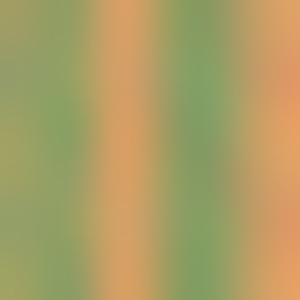

In [260]:
img = im.fromarray(noramalize(data[0]).astype('uint8'),'RGB')

basewidth = 300
wpercent = (basewidth / float(img.size[0]))
hsize = int((float(img.size[1]) * float(wpercent)))
img = img.resize((basewidth, hsize), im.LANCZOS)
img

In [202]:
import cv2

In [261]:
# an example code that works!

width = 1280
hieght = 720
channel = 3
 
fps = 30
sec = 5
 
# Syntax: VideoWriter_fourcc(c1, c2, c3, c4) # Concatenates 4 chars to a fourcc code
#  cv2.VideoWriter_fourcc('M','J','P','G') or cv2.VideoWriter_fourcc(*'MJPG)
 
fourcc = cv2.VideoWriter_fourcc(*'mp4v') # FourCC is a 4-byte code used to specify the video codec.
# A video codec is software or hardware that compresses and decompresses digital video. 
# In the context of video compression, codec is a portmanteau of encoder and decoder, 
# while a device that only compresses is typically called an encoder, and one that only 
# decompresses is a decoder. Source - Wikipedia
 
#Syntax: cv2.VideoWriter( filename, fourcc, fps, frameSize )
video = cv2.VideoWriter('test.mp4', fourcc, float(fps), (width, hieght))
 
for frame_count in range(fps*sec):
    img = np.random.randint(0,255, (hieght, width, channel), dtype = np.uint8)
    print(img.shape)
    print(img)
    video.write(img)

video.release()

(720, 1280, 3)
[[[212  13 192]
  [ 11 132 133]
  [129 115 193]
  ...
  [ 99 108 211]
  [ 35 117 221]
  [ 34  23  24]]

 [[160 218 167]
  [ 64 241  67]
  [239  43 163]
  ...
  [ 65 182  73]
  [ 15 147 202]
  [ 31 205  27]]

 [[ 86 249  93]
  [155  11 164]
  [196 220 165]
  ...
  [ 56 118  80]
  [ 64 175 145]
  [236 251  53]]

 ...

 [[188  85  65]
  [ 35 229  62]
  [216  22  44]
  ...
  [105  83 118]
  [121 151  14]
  [ 46  58 205]]

 [[133  29 228]
  [178 174  25]
  [ 30  75  50]
  ...
  [ 70 131 201]
  [163  71   2]
  [  9  29 192]]

 [[ 51 205 182]
  [132  18 124]
  [180 109 217]
  ...
  [143 221 218]
  [120 212 132]
  [140 185   0]]]
(720, 1280, 3)
[[[188  95  39]
  [186  79  38]
  [ 17  89 101]
  ...
  [ 36 126 202]
  [216 181 188]
  [123 219 226]]

 [[210 130  73]
  [244 235 218]
  [ 94 245 148]
  ...
  [ 60  50 174]
  [181  74  25]
  [ 18  63  55]]

 [[104  16  36]
  [118  97 215]
  [140 184 163]
  ...
  [210  87 110]
  [ 63 251 163]
  [141 193   0]]

 ...

 [[169 200 143]
  [243

(720, 1280, 3)
[[[221 246  65]
  [  9  26 217]
  [  4  52 102]
  ...
  [ 62  61 136]
  [ 11  26  47]
  [249 207 164]]

 [[ 45  88   8]
  [ 53  99 251]
  [ 71  12 228]
  ...
  [ 85 219  21]
  [ 24 247 147]
  [ 62 150  13]]

 [[236   6 113]
  [227 103  82]
  [ 88  20   1]
  ...
  [ 64  82 244]
  [164 245  44]
  [ 57 131 128]]

 ...

 [[ 76 145 231]
  [178 150  72]
  [252  56  89]
  ...
  [160  21 141]
  [189 165  88]
  [ 17 207   1]]

 [[ 36  17 104]
  [ 87  64  93]
  [225 176  66]
  ...
  [ 53 165  39]
  [  4 242  20]
  [164 228 120]]

 [[194 174  37]
  [158  13  17]
  [179 102 108]
  ...
  [197 204  42]
  [212 251 130]
  [215  85 118]]]
(720, 1280, 3)
[[[ 51  67 149]
  [  3   6 211]
  [ 26 200 198]
  ...
  [251 182  29]
  [237  95 189]
  [179 139 109]]

 [[162  62 239]
  [ 10  29 242]
  [ 96  26 246]
  ...
  [229 199 167]
  [192  37 221]
  [ 80 172 173]]

 [[ 35 224 217]
  [104 153  38]
  [ 80  93 108]
  ...
  [106  88  17]
  [142  68  84]
  [162  22 142]]

 ...

 [[177 195  52]
  [ 53

(720, 1280, 3)
[[[ 10 131  36]
  [193 173  11]
  [ 54  98 228]
  ...
  [ 82 103 183]
  [130 198 139]
  [ 28 170 168]]

 [[136  55 238]
  [193 195 130]
  [244  66 212]
  ...
  [102 192 163]
  [126 221  89]
  [137 191 121]]

 [[ 83 173 166]
  [ 12  53 200]
  [ 85 229  80]
  ...
  [228  44 165]
  [238 230 154]
  [ 55 204  65]]

 ...

 [[ 43 142 252]
  [ 60 131  21]
  [176  49 241]
  ...
  [ 14  80  83]
  [ 75   4 158]
  [105 174 211]]

 [[252 115  20]
  [183 245  55]
  [242  18  87]
  ...
  [217  29  32]
  [254 166  96]
  [160 126 121]]

 [[182 248  44]
  [104 246 184]
  [ 67 212 230]
  ...
  [202  34 197]
  [157  32 100]
  [ 39   9 253]]]
(720, 1280, 3)
[[[244 196 151]
  [151 144 120]
  [234  91 179]
  ...
  [ 69 187 168]
  [244  67  52]
  [  3 203 135]]

 [[128 152  99]
  [248 187 127]
  [141  58 171]
  ...
  [244   1  68]
  [181 251  26]
  [ 61 168  44]]

 [[139 146  86]
  [ 90 168  98]
  [173 219 193]
  ...
  [ 60 194  32]
  [ 24 209  12]
  [129  72 201]]

 ...

 [[ 16 252 108]
  [234

(720, 1280, 3)
[[[226 172 245]
  [ 31  99   1]
  [ 21  76 161]
  ...
  [240 238 182]
  [ 95  12  89]
  [233  93 161]]

 [[ 60 237 182]
  [197  93 159]
  [128 156 236]
  ...
  [189 219 121]
  [171 115 146]
  [ 62  74 220]]

 [[178   5 228]
  [209 116  23]
  [ 52 150  91]
  ...
  [162  96  65]
  [ 52 140 122]
  [ 12 104 214]]

 ...

 [[217  41 252]
  [194 134 147]
  [ 15 119 134]
  ...
  [129  26 212]
  [193 177  15]
  [ 62   7  56]]

 [[136 232  91]
  [ 32  23 198]
  [ 71 113 160]
  ...
  [179  59 168]
  [113   6 208]
  [222 228 172]]

 [[ 53  27 222]
  [215  23   9]
  [ 96 216 233]
  ...
  [135  41 238]
  [ 56 104  45]
  [175  14  25]]]
(720, 1280, 3)
[[[127  90  23]
  [ 41 111   2]
  [104 209 173]
  ...
  [199   9   5]
  [145 169  62]
  [166   0 217]]

 [[ 61  53  94]
  [102 250 123]
  [ 27 118 158]
  ...
  [235  62 153]
  [ 94 122 213]
  [210  32  72]]

 [[243 193 120]
  [ 70 104 152]
  [ 25 212 181]
  ...
  [ 97  15 147]
  [105 244 232]
  [ 47  34   1]]

 ...

 [[239 161 201]
  [200

(720, 1280, 3)
[[[ 20 193 164]
  [223  47  89]
  [199 231 138]
  ...
  [128  14 223]
  [107  38   2]
  [167 231 242]]

 [[  4  84  90]
  [136  71 125]
  [ 60 178  13]
  ...
  [ 41  24  80]
  [ 89 139  19]
  [ 61 249 239]]

 [[ 41 244  65]
  [ 97  65 201]
  [ 49 142 139]
  ...
  [175 243 107]
  [ 95   6  24]
  [159 164 122]]

 ...

 [[ 95 113 231]
  [245 165 173]
  [232  21 130]
  ...
  [172 173 183]
  [183  39  11]
  [ 15  29  43]]

 [[ 24 191  55]
  [ 92  72  21]
  [179  85  68]
  ...
  [135 243 245]
  [ 26 101  13]
  [248 213 163]]

 [[ 40 172  16]
  [ 36 225 169]
  [177  16 236]
  ...
  [  1 100 157]
  [ 23 157 169]
  [109  55  99]]]
(720, 1280, 3)
[[[235  19 135]
  [ 75 118  36]
  [251 229 176]
  ...
  [229  28 105]
  [137 172 215]
  [ 50 213 188]]

 [[197  24 245]
  [  7 145  97]
  [ 80 216  38]
  ...
  [131 210 247]
  [  8  75 125]
  [203  50  65]]

 [[173 114 194]
  [178 251   6]
  [167 156 191]
  ...
  [133  83  88]
  [ 34 110 253]
  [ 91 172 150]]

 ...

 [[160  59 160]
  [ 38

(720, 1280, 3)
[[[121  95 228]
  [104  72 193]
  [174  19 208]
  ...
  [ 23 211 253]
  [233  15  39]
  [121  45  40]]

 [[ 47 187 220]
  [189  40 140]
  [ 45 229 220]
  ...
  [110  22 154]
  [ 43 233  71]
  [ 30  94  32]]

 [[ 10  57  24]
  [ 32 222 132]
  [231  57 211]
  ...
  [241  68 233]
  [ 31  19 108]
  [ 61  62 168]]

 ...

 [[203  89 150]
  [128 223 253]
  [104  22  42]
  ...
  [223 217  13]
  [202  93 101]
  [ 45  98 161]]

 [[157 155  32]
  [ 52 149 108]
  [109  28   2]
  ...
  [154  94  91]
  [ 87 178 192]
  [249 156 225]]

 [[ 47  39  23]
  [106 116  85]
  [  6  37  26]
  ...
  [  1 221 119]
  [131 154 196]
  [132  21 218]]]
(720, 1280, 3)
[[[211 131  29]
  [ 57 252 205]
  [174  10 183]
  ...
  [ 78 248 162]
  [155  40 180]
  [188   1  32]]

 [[ 97  12 164]
  [ 33 163 144]
  [203  50  89]
  ...
  [ 85  23 144]
  [233 216 206]
  [119 194  63]]

 [[135 221 199]
  [135 214 185]
  [ 19 176 136]
  ...
  [251 123  10]
  [206  21  50]
  [152 213 243]]

 ...

 [[176 234   1]
  [ 51

(720, 1280, 3)
[[[219 146 156]
  [111  67 231]
  [186  85 126]
  ...
  [207  66 252]
  [ 18 159  90]
  [ 78 180  12]]

 [[100  86 106]
  [127 151 170]
  [ 53 125  54]
  ...
  [ 77 142   1]
  [227 179 126]
  [193 163 248]]

 [[ 44 174 101]
  [ 42  90 134]
  [207 191  25]
  ...
  [ 93 221  26]
  [ 64  16 221]
  [242 238  53]]

 ...

 [[119 163  81]
  [204  69 130]
  [135 148  98]
  ...
  [ 84  59 171]
  [ 26 175 229]
  [178 191 182]]

 [[ 91 106 204]
  [247 212  33]
  [234  61  26]
  ...
  [ 13 230 113]
  [ 20  77  78]
  [225 206 102]]

 [[126 138  96]
  [225   2 115]
  [136  27 152]
  ...
  [243 219 228]
  [ 93 172 109]
  [ 48  85  43]]]
(720, 1280, 3)
[[[ 44 163 215]
  [ 72 113 252]
  [ 81 112  69]
  ...
  [108 128 135]
  [ 96 132  52]
  [250 117  36]]

 [[  8   7 123]
  [120   5 183]
  [246 145 161]
  ...
  [193 233 127]
  [ 22 158  67]
  [223 236  77]]

 [[ 57   8  57]
  [102 205 234]
  [ 24  60 220]
  ...
  [139  56 149]
  [ 15 206 106]
  [ 61 135 216]]

 ...

 [[ 96 128 202]
  [ 46

(720, 1280, 3)
[[[ 99 149 146]
  [149  18  41]
  [ 76 180  82]
  ...
  [206  70  46]
  [ 65  94  85]
  [ 25  52 112]]

 [[117  54  85]
  [189 131 194]
  [137 254 114]
  ...
  [193 192 205]
  [187   1 114]
  [133 223 101]]

 [[ 79 122  73]
  [102 219 179]
  [209 120 110]
  ...
  [160  66   8]
  [ 95  98 238]
  [243  43 169]]

 ...

 [[ 30 142  49]
  [196  38 159]
  [221  22 176]
  ...
  [240  58  11]
  [109   1  32]
  [ 94 190 161]]

 [[186  59 148]
  [ 14  21 191]
  [192 146  80]
  ...
  [ 61  50  52]
  [  1 182 128]
  [ 80 128 170]]

 [[222  61 160]
  [237  11  37]
  [206  82 109]
  ...
  [ 29  17 181]
  [ 58 225  51]
  [205  39  44]]]
(720, 1280, 3)
[[[205 233  35]
  [ 85 140 253]
  [ 14  45 124]
  ...
  [194 100 145]
  [235 113 244]
  [129  77 102]]

 [[ 64  37 108]
  [ 60   6  89]
  [173 216 243]
  ...
  [168 190 145]
  [203 105  49]
  [230 203 183]]

 [[180 196 245]
  [195 234 229]
  [ 10  13 206]
  ...
  [145  84 217]
  [153  43  91]
  [113  66 104]]

 ...

 [[220 149 112]
  [201

(720, 1280, 3)
[[[121  93 186]
  [ 55  46  36]
  [ 91 236 102]
  ...
  [ 69  27 190]
  [174 199 225]
  [ 71 236 166]]

 [[ 27 196 121]
  [217 152 155]
  [223 210  65]
  ...
  [ 51  72 209]
  [ 16  37 155]
  [ 71  51 173]]

 [[218  66  88]
  [130  64 109]
  [229 184  71]
  ...
  [ 96  30  36]
  [102  54 208]
  [212 222 155]]

 ...

 [[242 223 139]
  [227  70 120]
  [226 197   9]
  ...
  [146 165 214]
  [ 12  59  67]
  [248 227 115]]

 [[ 91  17  19]
  [ 50   9 190]
  [  3 242 178]
  ...
  [ 87 206 230]
  [115  69 227]
  [  6 237 165]]

 [[245 192 204]
  [ 87 160 211]
  [121 176  16]
  ...
  [163  11 102]
  [144   5  75]
  [ 25 110 131]]]
(720, 1280, 3)
[[[130 219  70]
  [244  76 169]
  [ 38  17  37]
  ...
  [131 177 248]
  [ 45  53 144]
  [  5 164 111]]

 [[110 190  56]
  [ 87  23 115]
  [ 77  89 126]
  ...
  [100  42 102]
  [ 53  88 123]
  [101  36 212]]

 [[195 232  60]
  [ 51  59  99]
  [ 72 250 231]
  ...
  [155 246 248]
  [189 241 236]
  [140 225  49]]

 ...

 [[ 45 209  66]
  [  1

In [223]:
np.random.randint(0,255, (hieght, width, channel)).shape
g.combined_data()[0].shape
print(normalize(g.combined_data()[0]).astype(np.uint8))

[[[156 157 100]
  [152 158  99]
  [215 159 102]
  [149 157  96]
  [153 154 100]
  [212 159 102]]

 [[147 157 104]
  [155 161 100]
  [211 158 103]
  [148 158 101]
  [149 159 101]
  [211 153 102]]

 [[153 161  99]
  [144 159  98]
  [215 158 100]
  [147 154  98]
  [149 159 103]
  [217 159 100]]

 [[156 161 100]
  [152 158 102]
  [215 159 100]
  [149 157  98]
  [153 153 100]
  [212 159 102]]

 [[147 159 103]
  [155 160  98]
  [211 161 103]
  [150 157  99]
  [150 159 100]
  [211 153 101]]

 [[154 161  99]
  [145 157 100]
  [215 159 100]
  [147 156  96]
  [150 159 100]
  [217 159 100]]]


In [267]:
width = 600
height = 600
channel = 3

fps = g.timestamps.size/12.0

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video = cv2.VideoWriter('g2.mp4', fourcc, float(fps), (width, height))
 
for d in g.combined_data():
    img = normalize(d).astype(np.uint8)
    img = img.repeat(100, 0).repeat(100, 1)
    print(img.shape)
    print(img)
    video.write(img)

video.release()

(600, 600, 3)
[[[157 158 100]
  [157 158 100]
  [157 158 100]
  ...
  [218 186 101]
  [218 186 101]
  [218 186 101]]

 [[157 158 100]
  [157 158 100]
  [157 158 100]
  ...
  [218 186 101]
  [218 186 101]
  [218 186 101]]

 [[157 158 100]
  [157 158 100]
  [157 158 100]
  ...
  [218 186 101]
  [218 186 101]
  [218 186 101]]

 ...

 [[154 162  99]
  [154 162  99]
  [154 162  99]
  ...
  [212 158 100]
  [212 158 100]
  [212 158 100]]

 [[154 162  99]
  [154 162  99]
  [154 162  99]
  ...
  [212 158 100]
  [212 158 100]
  [212 158 100]]

 [[154 162  99]
  [154 162  99]
  [154 162  99]
  ...
  [212 158 100]
  [212 158 100]
  [212 158 100]]]
(600, 600, 3)
[[[148 157  99]
  [148 157  99]
  [148 157  99]
  ...
  [241 157 106]
  [241 157 106]
  [241 157 106]]

 [[148 157  99]
  [148 157  99]
  [148 157  99]
  ...
  [241 157 106]
  [241 157 106]
  [241 157 106]]

 [[148 157  99]
  [148 157  99]
  [148 157  99]
  ...
  [241 157 106]
  [241 157 106]
  [241 157 106]]

 ...

 [[148 160  97]
  [148 1

(600, 600, 3)
[[[151 157 100]
  [151 157 100]
  [151 157 100]
  ...
  [197 148  96]
  [197 148  96]
  [197 148  96]]

 [[151 157 100]
  [151 157 100]
  [151 157 100]
  ...
  [197 148  96]
  [197 148  96]
  [197 148  96]]

 [[151 157 100]
  [151 157 100]
  [151 157 100]
  ...
  [197 148  96]
  [197 148  96]
  [197 148  96]]

 ...

 [[148 156 101]
  [148 156 101]
  [148 156 101]
  ...
  [218 157  99]
  [218 157  99]
  [218 157  99]]

 [[148 156 101]
  [148 156 101]
  [148 156 101]
  ...
  [218 157  99]
  [218 157  99]
  [218 157  99]]

 [[148 156 101]
  [148 156 101]
  [148 156 101]
  ...
  [218 157  99]
  [218 157  99]
  [218 157  99]]]
(600, 600, 3)
[[[141 157 100]
  [141 157 100]
  [141 157 100]
  ...
  [232 160 108]
  [232 160 108]
  [232 160 108]]

 [[141 157 100]
  [141 157 100]
  [141 157 100]
  ...
  [232 160 108]
  [232 160 108]
  [232 160 108]]

 [[141 157 100]
  [141 157 100]
  [141 157 100]
  ...
  [232 160 108]
  [232 160 108]
  [232 160 108]]

 ...

 [[145 156  99]
  [145 1

(600, 600, 3)
[[[147 159 103]
  [147 159 103]
  [147 159 103]
  ...
  [215 162 103]
  [215 162 103]
  [215 162 103]]

 [[147 159 103]
  [147 159 103]
  [147 159 103]
  ...
  [215 162 103]
  [215 162 103]
  [215 162 103]]

 [[147 159 103]
  [147 159 103]
  [147 159 103]
  ...
  [215 162 103]
  [215 162 103]
  [215 162 103]]

 ...

 [[157 160  99]
  [157 160  99]
  [157 160  99]
  ...
  [218 174  99]
  [218 174  99]
  [218 174  99]]

 [[157 160  99]
  [157 160  99]
  [157 160  99]
  ...
  [218 174  99]
  [218 174  99]
  [218 174  99]]

 [[157 160  99]
  [157 160  99]
  [157 160  99]
  ...
  [218 174  99]
  [218 174  99]
  [218 174  99]]]
(600, 600, 3)
[[[116 158  98]
  [116 158  98]
  [116 158  98]
  ...
  [224 149 111]
  [224 149 111]
  [224 149 111]]

 [[116 158  98]
  [116 158  98]
  [116 158  98]
  ...
  [224 149 111]
  [224 149 111]
  [224 149 111]]

 [[116 158  98]
  [116 158  98]
  [116 158  98]
  ...
  [224 149 111]
  [224 149 111]
  [224 149 111]]

 ...

 [[147 158  98]
  [147 1

(600, 600, 3)
[[[215 158 101]
  [215 158 101]
  [215 158 101]
  ...
  [139 140 100]
  [139 140 100]
  [139 140 100]]

 [[215 158 101]
  [215 158 101]
  [215 158 101]
  ...
  [139 140 100]
  [139 140 100]
  [139 140 100]]

 [[215 158 101]
  [215 158 101]
  [215 158 101]
  ...
  [139 140 100]
  [139 140 100]
  [139 140 100]]

 ...

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [133 192 121]
  [133 192 121]
  [133 192 121]]

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [133 192 121]
  [133 192 121]
  [133 192 121]]

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [133 192 121]
  [133 192 121]
  [133 192 121]]]
(600, 600, 3)
[[[232 158 100]
  [232 158 100]
  [232 158 100]
  ...
  [198 160 108]
  [198 160 108]
  [198 160 108]]

 [[232 158 100]
  [232 158 100]
  [232 158 100]
  ...
  [198 160 108]
  [198 160 108]
  [198 160 108]]

 [[232 158 100]
  [232 158 100]
  [232 158 100]
  ...
  [198 160 108]
  [198 160 108]
  [198 160 108]]

 ...

 [[236 157 102]
  [236 1

(600, 600, 3)
[[[214 159 102]
  [214 159 102]
  [214 159 102]
  ...
  [122 165  97]
  [122 165  97]
  [122 165  97]]

 [[214 159 102]
  [214 159 102]
  [214 159 102]
  ...
  [122 165  97]
  [122 165  97]
  [122 165  97]]

 [[214 159 102]
  [214 159 102]
  [214 159 102]
  ...
  [122 165  97]
  [122 165  97]
  [122 165  97]]

 ...

 [[218 174  98]
  [218 174  98]
  [218 174  98]
  ...
  [153 162  94]
  [153 162  94]
  [153 162  94]]

 [[218 174  98]
  [218 174  98]
  [218 174  98]
  ...
  [153 162  94]
  [153 162  94]
  [153 162  94]]

 [[218 174  98]
  [218 174  98]
  [218 174  98]
  ...
  [153 162  94]
  [153 162  94]
  [153 162  94]]]
(600, 600, 3)
[[[232 158 101]
  [232 158 101]
  [232 158 101]
  ...
  [193 155 103]
  [193 155 103]
  [193 155 103]]

 [[232 158 101]
  [232 158 101]
  [232 158 101]
  ...
  [193 155 103]
  [193 155 103]
  [193 155 103]]

 [[232 158 101]
  [232 158 101]
  [232 158 101]
  ...
  [193 155 103]
  [193 155 103]
  [193 155 103]]

 ...

 [[241 157 105]
  [241 1

(600, 600, 3)
[[[212 159 100]
  [212 159 100]
  [212 159 100]
  ...
  [157 156  98]
  [157 156  98]
  [157 156  98]]

 [[212 159 100]
  [212 159 100]
  [212 159 100]
  ...
  [157 156  98]
  [157 156  98]
  [157 156  98]]

 [[212 159 100]
  [212 159 100]
  [212 159 100]
  ...
  [157 156  98]
  [157 156  98]
  [157 156  98]]

 ...

 [[201 142  97]
  [201 142  97]
  [201 142  97]
  ...
  [139 143 100]
  [139 143 100]
  [139 143 100]]

 [[201 142  97]
  [201 142  97]
  [201 142  97]
  ...
  [139 143 100]
  [139 143 100]
  [139 143 100]]

 [[201 142  97]
  [201 142  97]
  [201 142  97]
  ...
  [139 143 100]
  [139 143 100]
  [139 143 100]]]
(600, 600, 3)
[[[229 158 102]
  [229 158 102]
  [229 158 102]
  ...
  [195 158 100]
  [195 158 100]
  [195 158 100]]

 [[229 158 102]
  [229 158 102]
  [229 158 102]
  ...
  [195 158 100]
  [195 158 100]
  [195 158 100]]

 [[229 158 102]
  [229 158 102]
  [229 158 102]
  ...
  [195 158 100]
  [195 158 100]
  [195 158 100]]

 ...

 [[233 160 108]
  [233 1

(600, 600, 3)
[[[212 159 101]
  [212 159 101]
  [212 159 101]
  ...
  [151 158 102]
  [151 158 102]
  [151 158 102]]

 [[212 159 101]
  [212 159 101]
  [212 159 101]
  ...
  [151 158 102]
  [151 158 102]
  [151 158 102]]

 [[212 159 101]
  [212 159 101]
  [212 159 101]
  ...
  [151 158 102]
  [151 158 102]
  [151 158 102]]

 ...

 [[215 161 101]
  [215 161 101]
  [215 161 101]
  ...
  [133 157  93]
  [133 157  93]
  [133 157  93]]

 [[215 161 101]
  [215 161 101]
  [215 161 101]
  ...
  [133 157  93]
  [133 157  93]
  [133 157  93]]

 [[215 161 101]
  [215 161 101]
  [215 161 101]
  ...
  [133 157  93]
  [133 157  93]
  [133 157  93]]]
(600, 600, 3)
[[[227 158 100]
  [227 158 100]
  [227 158 100]
  ...
  [194 156  99]
  [194 156  99]
  [194 156  99]]

 [[227 158 100]
  [227 158 100]
  [227 158 100]
  ...
  [194 156  99]
  [194 156  99]
  [194 156  99]]

 [[227 158 100]
  [227 158 100]
  [227 158 100]
  ...
  [194 156  99]
  [194 156  99]
  [194 156  99]]

 ...

 [[227 151 111]
  [227 1

(600, 600, 3)
[[[194 157 100]
  [194 157 100]
  [194 157 100]
  ...
  [117 159  97]
  [117 159  97]
  [117 159  97]]

 [[194 157 100]
  [194 157 100]
  [194 157 100]
  ...
  [117 159  97]
  [117 159  97]
  [117 159  97]]

 [[194 157 100]
  [194 157 100]
  [194 157 100]
  ...
  [117 159  97]
  [117 159  97]
  [117 159  97]]

 ...

 [[192 158 108]
  [192 158 108]
  [192 158 108]
  ...
  [148 155 100]
  [148 155 100]
  [148 155 100]]

 [[192 158 108]
  [192 158 108]
  [192 158 108]
  ...
  [148 155 100]
  [148 155 100]
  [148 155 100]]

 [[192 158 108]
  [192 158 108]
  [192 158 108]
  ...
  [148 155 100]
  [148 155 100]
  [148 155 100]]]
(600, 600, 3)
[[[217 157 101]
  [217 157 101]
  [217 157 101]
  ...
  [136 197 132]
  [136 197 132]
  [136 197 132]]

 [[217 157 101]
  [217 157 101]
  [217 157 101]
  ...
  [136 197 132]
  [136 197 132]
  [136 197 132]]

 [[217 157 101]
  [217 157 101]
  [217 157 101]
  ...
  [136 197 132]
  [136 197 132]
  [136 197 132]]

 ...

 [[213 159 100]
  [213 1

(600, 600, 3)
[[[150 158 100]
  [150 158 100]
  [150 158 100]
  ...
  [151 158 101]
  [151 158 101]
  [151 158 101]]

 [[150 158 100]
  [150 158 100]
  [150 158 100]
  ...
  [151 158 101]
  [151 158 101]
  [151 158 101]]

 [[150 158 100]
  [150 158 100]
  [150 158 100]
  ...
  [151 158 101]
  [151 158 101]
  [151 158 101]]

 ...

 [[132 157  93]
  [132 157  93]
  [132 157  93]
  ...
  [151 157 100]
  [151 157 100]
  [151 157 100]]

 [[132 157  93]
  [132 157  93]
  [132 157  93]
  ...
  [151 157 100]
  [151 157 100]
  [151 157 100]]

 [[132 157  93]
  [132 157  93]
  [132 157  93]
  ...
  [151 157 100]
  [151 157 100]
  [151 157 100]]]
(600, 600, 3)
[[[193 159 102]
  [193 159 102]
  [193 159 102]
  ...
  [146 157  99]
  [146 157  99]
  [146 157  99]]

 [[193 159 102]
  [193 159 102]
  [193 159 102]
  ...
  [146 157  99]
  [146 157  99]
  [146 157  99]]

 [[193 159 102]
  [193 159 102]
  [193 159 102]
  ...
  [146 157  99]
  [146 157  99]
  [146 157  99]]

 ...

 [[193 156 103]
  [193 1

(600, 600, 3)
[[[144 160  99]
  [144 160  99]
  [144 160  99]
  ...
  [154 161 100]
  [154 161 100]
  [154 161 100]]

 [[144 160  99]
  [144 160  99]
  [144 160  99]
  ...
  [154 161 100]
  [154 161 100]
  [154 161 100]]

 [[144 160  99]
  [144 160  99]
  [144 160  99]
  ...
  [154 161 100]
  [154 161 100]
  [154 161 100]]

 ...

 [[157 155 100]
  [157 155 100]
  [157 155 100]
  ...
  [147 157 101]
  [147 157 101]
  [147 157 101]]

 [[157 155 100]
  [157 155 100]
  [157 155 100]
  ...
  [147 157 101]
  [147 157 101]
  [147 157 101]]

 [[157 155 100]
  [157 155 100]
  [157 155 100]
  ...
  [147 157 101]
  [147 157 101]
  [147 157 101]]]
(600, 600, 3)
[[[191 159  99]
  [191 159  99]
  [191 159  99]
  ...
  [149 159  94]
  [149 159  94]
  [149 159  94]]

 [[191 159  99]
  [191 159  99]
  [191 159  99]
  ...
  [149 159  94]
  [149 159  94]
  [149 159  94]]

 [[191 159  99]
  [191 159  99]
  [191 159  99]
  ...
  [149 159  94]
  [149 159  94]
  [149 159  94]]

 ...

 [[194 158 101]
  [194 1

(600, 600, 3)
[[[192 159 102]
  [192 159 102]
  [192 159 102]
  ...
  [145 156  99]
  [145 156  99]
  [145 156  99]]

 [[192 159 102]
  [192 159 102]
  [192 159 102]
  ...
  [145 156  99]
  [145 156  99]
  [145 156  99]]

 [[192 159 102]
  [192 159 102]
  [192 159 102]
  ...
  [145 156  99]
  [145 156  99]
  [145 156  99]]

 ...

 [[193 157  99]
  [193 157  99]
  [193 157  99]
  ...
  [145 156  97]
  [145 156  97]
  [145 156  97]]

 [[193 157  99]
  [193 157  99]
  [193 157  99]
  ...
  [145 156  97]
  [145 156  97]
  [145 156  97]]

 [[193 157  99]
  [193 157  99]
  [193 157  99]
  ...
  [145 156  97]
  [145 156  97]
  [145 156  97]]]
(600, 600, 3)
[[[214 159 101]
  [214 159 101]
  [214 159 101]
  ...
  [126 166  97]
  [126 166  97]
  [126 166  97]]

 [[214 159 101]
  [214 159 101]
  [214 159 101]
  ...
  [126 166  97]
  [126 166  97]
  [126 166  97]]

 [[214 159 101]
  [214 159 101]
  [214 159 101]
  ...
  [126 166  97]
  [126 166  97]
  [126 166  97]]

 ...

 [[218 174  98]
  [218 1

(600, 600, 3)
[[[212 159 100]
  [212 159 100]
  [212 159 100]
  ...
  [157 155  99]
  [157 155  99]
  [157 155  99]]

 [[212 159 100]
  [212 159 100]
  [212 159 100]
  ...
  [157 155  99]
  [157 155  99]
  [157 155  99]]

 [[212 159 100]
  [212 159 100]
  [212 159 100]
  ...
  [157 155  99]
  [157 155  99]
  [157 155  99]]

 ...

 [[201 143  97]
  [201 143  97]
  [201 143  97]
  ...
  [139 143 100]
  [139 143 100]
  [139 143 100]]

 [[201 143  97]
  [201 143  97]
  [201 143  97]
  ...
  [139 143 100]
  [139 143 100]
  [139 143 100]]

 [[201 143  97]
  [201 143  97]
  [201 143  97]
  ...
  [139 143 100]
  [139 143 100]
  [139 143 100]]]
(600, 600, 3)
[[[229 158 102]
  [229 158 102]
  [229 158 102]
  ...
  [195 158 100]
  [195 158 100]
  [195 158 100]]

 [[229 158 102]
  [229 158 102]
  [229 158 102]
  ...
  [195 158 100]
  [195 158 100]
  [195 158 100]]

 [[229 158 102]
  [229 158 102]
  [229 158 102]
  ...
  [195 158 100]
  [195 158 100]
  [195 158 100]]

 ...

 [[233 160 108]
  [233 1

(600, 600, 3)
[[[194 159  99]
  [194 159  99]
  [194 159  99]
  ...
  [142 158 101]
  [142 158 101]
  [142 158 101]]

 [[194 159  99]
  [194 159  99]
  [194 159  99]
  ...
  [142 158 101]
  [142 158 101]
  [142 158 101]]

 [[194 159  99]
  [194 159  99]
  [194 159  99]
  ...
  [142 158 101]
  [142 158 101]
  [142 158 101]]

 ...

 [[192 156 105]
  [192 156 105]
  [192 156 105]
  ...
  [144 157  99]
  [144 157  99]
  [144 157  99]]

 [[192 156 105]
  [192 156 105]
  [192 156 105]
  ...
  [144 157  99]
  [144 157  99]
  [144 157  99]]

 [[192 156 105]
  [192 156 105]
  [192 156 105]
  ...
  [144 157  99]
  [144 157  99]
  [144 157  99]]]
(600, 600, 3)
[[[212 159 100]
  [212 159 100]
  [212 159 100]
  ...
  [151 158 102]
  [151 158 102]
  [151 158 102]]

 [[212 159 100]
  [212 159 100]
  [212 159 100]
  ...
  [151 158 102]
  [151 158 102]
  [151 158 102]]

 [[212 159 100]
  [212 159 100]
  [212 159 100]
  ...
  [151 158 102]
  [151 158 102]
  [151 158 102]]

 ...

 [[215 161 101]
  [215 1

[[[180. 159. 101.]
  [180. 159. 101.]
  [180. 159. 101.]
  ...
  [181. 158. 101.]
  [181. 158. 101.]
  [181. 158. 101.]]

 [[180. 159. 101.]
  [180. 159. 101.]
  [180. 159. 101.]
  ...
  [181. 158. 101.]
  [181. 158. 101.]
  [181. 158. 101.]]

 [[180. 159. 101.]
  [180. 159. 101.]
  [180. 159. 101.]
  ...
  [181. 158. 101.]
  [181. 158. 101.]
  [181. 158. 101.]]

 ...

 [[180. 158. 101.]
  [180. 158. 101.]
  [180. 158. 101.]
  ...
  [180. 158. 101.]
  [180. 158. 101.]
  [180. 158. 101.]]

 [[180. 158. 101.]
  [180. 158. 101.]
  [180. 158. 101.]
  ...
  [180. 158. 101.]
  [180. 158. 101.]
  [180. 158. 101.]]

 [[180. 158. 101.]
  [180. 158. 101.]
  [180. 158. 101.]
  ...
  [180. 158. 101.]
  [180. 158. 101.]
  [180. 158. 101.]]]


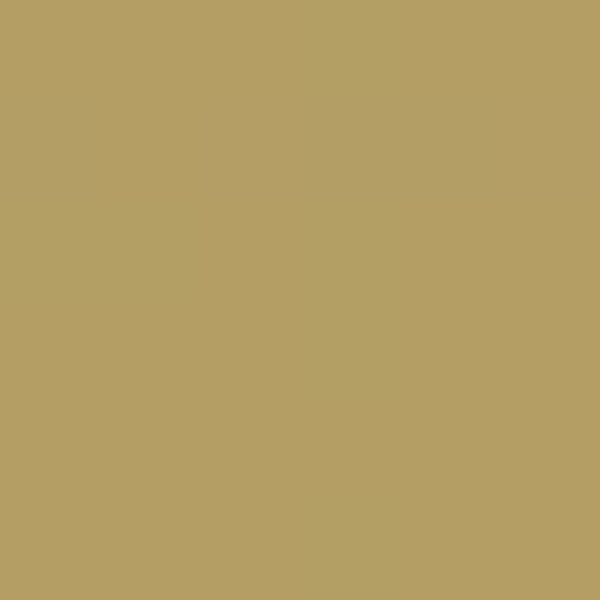

In [295]:


avg_data = sum(data)/len(data)
avg_data_100 = avg_data.repeat(100, 0).repeat(100, 1)
print(np.round(normalize(avg_data_100)))

img = im.fromarray(normalize(avg_data_100).astype('uint8'),'RGB')
img
# print(img)
# basewidth = 600
# wpercent = (basewidth / float(img.size[0]))
# hsize = int((float(img.size[1]) * float(wpercent)))
# img = img.resize((basewidth, hsize), im.LANCZOS)
# img

In [200]:
import imageio

In [201]:
# writer = imageio.get_writer('all_channels.mp4', fps=30)
# writer_shearx = imageio.get_writer('shear_x.mp4', fps=30)
# writer_sheary = imageio.get_writer('shear_y.mp4', fps=30)
# writer_pressure = imageio.get_writer('pressure.mp4', fps=30)


# for instance in data:
#     img = im.fromarray(normalize(instance).astype('uint8'),'RGB')
#     img = img.resize((basewidth, hsize), im.LANCZOS)
#     pressure, shear_x, shear_y = img.split()
    
#     writer.append_data(np.array(img))
#     writer_pressure.append_data(np.array(pressure))
#     writer_shearx.append_data(np.array(shear_x))
#     writer_sheary.append_data(np.array(shear_y))

# writer.close()
# writer_pressure.close()
# writer_shearx.close()
# writer_sheary.close()

FileNotFoundError: [Errno 2] No such file or directory: '/usr/bin/ffmpeg'

# 3D CNN for video classification

Follow tutorial: https://www.tensorflow.org/tutorials/video/video_classification

In [ ]:
import tqdm
import random
import pathlib
import itertools
import collections

import cv2
import einops
import numpy as np
import remotezip as rz
import seaborn as sns
import matplotlib.pyplot as plt

import tensorflow as tf
import keras
from keras import layers

In [ ]:
def list_files_per_class(zip_url):
    """
    List the files in each class of the dataset given the zip URL.

    Args:
      zip_url: URL from which the files can be unzipped. 

    Return:
      files: List of files in each of the classes.
    """
    files = []
    with rz.RemoteZip(URL) as zip:
        for zip_info in zip.infolist():
            files.append(zip_info.filename)
    return files

def get_class(fname):
  """
    Retrieve the name of the class given a filename.

    Args:
      fname: Name of the file in the UCF101 dataset.

    Return:
      Class that the file belongs to.
  """
  return fname.split('_')[-3]

def get_files_per_class(files):
  """
    Retrieve the files that belong to each class. 

    Args:
      files: List of files in the dataset.

    Return:
      Dictionary of class names (key) and files (values).
  """
    files_for_class = collections.defaultdict(list)
    for fname in files:
        class_name = get_class(fname)
        files_for_class[class_name].append(fname)
    return files_for_class

def download_from_zip(zip_url, to_dir, file_names):
    """
    Download the contents of the zip file from the zip URL.

    Args:
      zip_url: Zip URL containing data.
      to_dir: Directory to download data to.
      file_names: Names of files to download.
    """
    with rz.RemoteZip(zip_url) as zip:
        for fn in tqdm.tqdm(file_names):
            class_name = get_class(fn)
            zip.extract(fn, str(to_dir / class_name))
            unzipped_file = to_dir / class_name / fn

            fn = pathlib.Path(fn).parts[-1]
            output_file = to_dir / class_name / fn
            unzipped_file.rename(output_file,)

def split_class_lists(files_for_class, count):
    """
    Returns the list of files belonging to a subset of data as well as the remainder of
    files that need to be downloaded.

    Args:
      files_for_class: Files belonging to a particular class of data.
      count: Number of files to download.

    Return:
      split_files: Files belonging to the subset of data.
      remainder: Dictionary of the remainder of files that need to be downloaded.
    """
    split_files = []
    remainder = {}
    for cls in files_for_class:
        split_files.extend(files_for_class[cls][:count])
        remainder[cls] = files_for_class[cls][count:]
    return split_files, remainder

def download_ufc_101_subset(zip_url, num_classes, splits, download_dir):
    """
    Download a subset of the UFC101 dataset and split them into various parts, such as
    training, validation, and test. 

    Args:
      zip_url: Zip URL containing data.
      num_classes: Number of labels.
      splits: Dictionary specifying the training, validation, test, etc. (key) division of data 
              (value is number of files per split).
      download_dir: Directory to download data to.

    Return:
      dir: Posix path of the resulting directories containing the splits of data.
    """
    files = list_files_per_class(zip_url)
    for f in files:
        tokens = f.split('/')
        if len(tokens) <= 2:
            files.remove(f) # Remove that item from the list if it does not have a filename

    files_for_class = get_files_per_class(files)

    classes = list(files_for_class.keys())[:num_classes]

    for cls in classes:
        new_files_for_class = files_for_class[cls]
        random.shuffle(new_files_for_class)
        files_for_class[cls] = new_files_for_class

    # Only use the number of classes you want in the dictionary
    files_for_class = {x: files_for_class[x] for x in list(files_for_class)[:num_classes]}

    dirs = {}
    for split_name, split_count in splits.items():
        print(split_name, ":")
        split_dir = download_dir / split_name
        split_files, files_for_class = split_class_lists(files_for_class, split_count)
        download_from_zip(zip_url, split_dir, split_files)
        dirs[split_name] = split_dir
        
    return dirs

def format_frames(frame, output_size):
    """
    Pad and resize an image from a video.

    Args:
      frame: Image that needs to resized and padded. 
      output_size: Pixel size of the output frame image.

    Return:
      Formatted frame with padding of specified output size.
    """
    frame = tf.image.convert_image_dtype(frame, tf.float32)
    frame = tf.image.resize_with_pad(frame, *output_size)
    return frame

def frames_from_video_file(video_path, n_frames, output_size = (224,224), frame_step = 15):
    """
    Creates frames from each video file present for each category.

    Args:
      video_path: File path to the video.
      n_frames: Number of frames to be created per video file.
      output_size: Pixel size of the output frame image.

    Return:
      An NumPy array of frames in the shape of (n_frames, height, width, channels).
    """
    # Read each video frame by frame
    result = []
    src = cv2.VideoCapture(str(video_path))  

    video_length = src.get(cv2.CAP_PROP_FRAME_COUNT)

    need_length = 1 + (n_frames - 1) * frame_step

    if need_length > video_length:
        start = 0
    else:
        max_start = video_length - need_length
        start = random.randint(0, max_start + 1)

    src.set(cv2.CAP_PROP_POS_FRAMES, start)
    # ret is a boolean indicating whether read was successful, frame is the image itself
    ret, frame = src.read()
    result.append(format_frames(frame, output_size))

    for _ in range(n_frames - 1):
        for _ in range(frame_step):
            ret, frame = src.read()
        if ret:
            frame = format_frames(frame, output_size)
            result.append(frame)
        else:
            result.append(np.zeros_like(result[0]))
    src.release()
    result = np.array(result)[..., [2, 1, 0]]

    return result

class FrameGenerator:
    def __init__(self, path, n_frames, training = False):
    """ Returns a set of frames with their associated label. 

      Args:
        path: Video file paths.
        n_frames: Number of frames. 
        training: Boolean to determine if training dataset is being created.
    """
        self.path = path
        self.n_frames = n_frames
        self.training = training
        self.class_names = sorted(set(p.name for p in self.path.iterdir() if p.is_dir()))
        self.class_ids_for_name = dict((name, idx) for idx, name in enumerate(self.class_names))

    def get_files_and_class_names(self):
        video_paths = list(self.path.glob('*/*.avi'))
        classes = [p.parent.name for p in video_paths] 
        return video_paths, classes

    def __call__(self):
        video_paths, classes = self.get_files_and_class_names()

        pairs = list(zip(video_paths, classes))

        if self.training:
            random.shuffle(pairs)

        for path, name in pairs:
            video_frames = frames_from_video_file(path, self.n_frames) 
            label = self.class_ids_for_name[name] # Encode labels
            yield video_frames, label

In [ ]:
URL = 'https://storage.googleapis.com/thumos14_files/UCF101_videos.zip'
download_dir = pathlib.Path('./UCF101_subset/')
subset_paths = download_ufc_101_subset(URL, 
                        num_classes = 10, 
                        splits = {"train": 30, "val": 10, "test": 10},
                        download_dir = download_dir)

In [ ]:
n_frames = 10
batch_size = 8

output_signature = (tf.TensorSpec(shape = (None, None, None, 3), dtype = tf.float32),
                    tf.TensorSpec(shape = (), dtype = tf.int16))

train_ds = tf.data.Dataset.from_generator(FrameGenerator(subset_paths['train'], n_frames, training=True),
                                          output_signature = output_signature)


# Batch the data
train_ds = train_ds.batch(batch_size)

val_ds = tf.data.Dataset.from_generator(FrameGenerator(subset_paths['val'], n_frames),
                                        output_signature = output_signature)
val_ds = val_ds.batch(batch_size)

test_ds = tf.data.Dataset.from_generator(FrameGenerator(subset_paths['test'], n_frames),
                                         output_signature = output_signature)

test_ds = test_ds.batch(batch_size)

In [ ]:
# Define the dimensions of one frame in the set of frames created
HEIGHT = 224
WIDTH = 224

In [ ]:
class Conv2Plus1D(keras.layers.Layer):
    def __init__(self, filters, kernel_size, padding):
    """
      A sequence of convolutional layers that first apply the convolution operation over the
      spatial dimensions, and then the temporal dimension. 
    """
    super().__init__()
    self.seq = keras.Sequential([  
        # Spatial decomposition
        layers.Conv3D(filters=filters,
                      kernel_size=(1, kernel_size[1], kernel_size[2]),
                      padding=padding),
        # Temporal decomposition
        layers.Conv3D(filters=filters, 
                      kernel_size=(kernel_size[0], 1, 1),
                      padding=padding)
        ])

    def call(self, x):
        return self.seq(x)

In [ ]:
class ResidualMain(keras.layers.Layer):
    """
    Residual block of the model with convolution, layer normalization, and the
    activation function, ReLU.
    """
    def __init__(self, filters, kernel_size):
        super().__init__()
        self.seq = keras.Sequential([
            Conv2Plus1D(filters=filters,
                        kernel_size=kernel_size,
                        padding='same'),
            layers.LayerNormalization(),
            layers.ReLU(),
            Conv2Plus1D(filters=filters, 
                        kernel_size=kernel_size,
                        padding='same'),
            layers.LayerNormalization()
        ])

    def call(self, x):
        return self.seq(x)

In [ ]:
class Project(keras.layers.Layer):
    """
    Project certain dimensions of the tensor as the data is passed through different 
    sized filters and downsampled. 
    """
    def __init__(self, units):
        super().__init__()
        self.seq = keras.Sequential([
            layers.Dense(units),
            layers.LayerNormalization()
        ])

    def call(self, x):
        return self.seq(x)

In [ ]:
def add_residual_block(input, filters, kernel_size):
    """
    Add residual blocks to the model. If the last dimensions of the input data
    and filter size does not match, project it such that last dimension matches.
    """
    out = ResidualMain(filters, 
                     kernel_size)(input)

    res = input
    # Using the Keras functional APIs, project the last dimension of the tensor to
    # match the new filter size
    if out.shape[-1] != input.shape[-1]:
        res = Project(out.shape[-1])(res)

    return layers.add([res, out])

In [ ]:
class ResizeVideo(keras.layers.Layer):
    def __init__(self, height, width):
        super().__init__()
        self.height = height
        self.width = width
        self.resizing_layer = layers.Resizing(self.height, self.width)

    def call(self, video):
    """
      Use the einops library to resize the tensor.  

      Args:
        video: Tensor representation of the video, in the form of a set of frames.

      Return:
        A downsampled size of the video according to the new height and width it should be resized to.
    """
        # b stands for batch size, t stands for time, h stands for height, 
        # w stands for width, and c stands for the number of channels.
        old_shape = einops.parse_shape(video, 'b t h w c')
        images = einops.rearrange(video, 'b t h w c -> (b t) h w c')
        images = self.resizing_layer(images)
        videos = einops.rearrange(
            images, '(b t) h w c -> b t h w c',
            t = old_shape['t'])
        return videos

In [ ]:
input_shape = (None, 10, HEIGHT, WIDTH, 3)
input = layers.Input(shape=(input_shape[1:]))
x = input

x = Conv2Plus1D(filters=16, kernel_size=(3, 7, 7), padding='same')(x)
x = layers.BatchNormalization()(x)
x = layers.ReLU()(x)
x = ResizeVideo(HEIGHT // 2, WIDTH // 2)(x)

# Block 1
x = add_residual_block(x, 16, (3, 3, 3))
x = ResizeVideo(HEIGHT // 4, WIDTH // 4)(x)

# Block 2
x = add_residual_block(x, 32, (3, 3, 3))
x = ResizeVideo(HEIGHT // 8, WIDTH // 8)(x)

# Block 3
x = add_residual_block(x, 64, (3, 3, 3))
x = ResizeVideo(HEIGHT // 16, WIDTH // 16)(x)

# Block 4
x = add_residual_block(x, 128, (3, 3, 3))

x = layers.GlobalAveragePooling3D()(x)
x = layers.Flatten()(x)
x = layers.Dense(10)(x)

model = keras.Model(input, x)

In [ ]:
frames, label = next(iter(train_ds))
model.build(frames)

In [ ]:
# Visualize the model
keras.utils.plot_model(model, expand_nested=True, dpi=60, show_shapes=True)

In [ ]:
model.compile(loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True), 
              optimizer = keras.optimizers.Adam(learning_rate = 0.0001), 
              metrics = ['accuracy'])

In [ ]:
history = model.fit(x = train_ds,
                    epochs = 50, 
                    validation_data = val_ds)

In [ ]:
def plot_history(history):
    """
    Plotting training and validation learning curves.

    Args:
      history: model history with all the metric measures
    """
    fig, (ax1, ax2) = plt.subplots(2)

    fig.set_size_inches(18.5, 10.5)

    # Plot loss
    ax1.set_title('Loss')
    ax1.plot(history.history['loss'], label = 'train')
    ax1.plot(history.history['val_loss'], label = 'test')
    ax1.set_ylabel('Loss')

    # Determine upper bound of y-axis
    max_loss = max(history.history['loss'] + history.history['val_loss'])

    ax1.set_ylim([0, np.ceil(max_loss)])
    ax1.set_xlabel('Epoch')
    ax1.legend(['Train', 'Validation']) 

    # Plot accuracy
    ax2.set_title('Accuracy')
    ax2.plot(history.history['accuracy'],  label = 'train')
    ax2.plot(history.history['val_accuracy'], label = 'test')
    ax2.set_ylabel('Accuracy')
    ax2.set_ylim([0, 1])
    ax2.set_xlabel('Epoch')
    ax2.legend(['Train', 'Validation'])

    plt.show()

plot_history(history)

In [ ]:
model.evaluate(test_ds, return_dict=True)

In [ ]:
def get_actual_predicted_labels(dataset): 
    """
    Create a list of actual ground truth values and the predictions from the model.

    Args:
      dataset: An iterable data structure, such as a TensorFlow Dataset, with features and labels.

    Return:
      Ground truth and predicted values for a particular dataset.
    """
    actual = [labels for _, labels in dataset.unbatch()]
    predicted = model.predict(dataset)

    actual = tf.stack(actual, axis=0)
    predicted = tf.concat(predicted, axis=0)
    predicted = tf.argmax(predicted, axis=1)

    return actual, predicted

In [ ]:
fg = FrameGenerator(subset_paths['train'], n_frames, training=True)
labels = list(fg.class_ids_for_name.keys())

In [ ]:
actual, predicted = get_actual_predicted_labels(train_ds)
plot_confusion_matrix(actual, predicted, labels, 'training')

In [ ]:
actual, predicted = get_actual_predicted_labels(test_ds)
plot_confusion_matrix(actual, predicted, labels, 'test')

In [ ]:
def calculate_classification_metrics(y_actual, y_pred, labels):
    """
    Calculate the precision and recall of a classification model using the ground truth and
    predicted values. 

    Args:
      y_actual: Ground truth labels.
      y_pred: Predicted labels.
      labels: List of classification labels.

    Return:
      Precision and recall measures.
    """
    cm = tf.math.confusion_matrix(y_actual, y_pred)
    tp = np.diag(cm) # Diagonal represents true positives
    precision = dict()
    recall = dict()
    for i in range(len(labels)):
    col = cm[:, i]
    fp = np.sum(col) - tp[i] # Sum of column minus true positive is false negative

    row = cm[i, :]
    fn = np.sum(row) - tp[i] # Sum of row minus true positive, is false negative

    precision[labels[i]] = tp[i] / (tp[i] + fp) # Precision 

    recall[labels[i]] = tp[i] / (tp[i] + fn) # Recall

    return precision, recall

In [ ]:
precision, recall = calculate_classification_metrics(actual, predicted, labels) # Test dataset

In [ ]:
precision

In [ ]:
recall